In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


[I 2025-05-22 01:46:18,267] A new study created in memory with name: no-name-69e785ef-547d-409f-80d0-009fd75bec60
[I 2025-05-22 01:51:04,498] Trial 0 finished with value: 0.0861133724451065 and parameters: {'lr': 0.002993858961855104, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4532712966553972}. Best is trial 0 with value: 0.0861133724451065.


Cross Validation Accuracies:
[0.06773945689201355, 0.06844450533390045, 0.11178705096244812, 0.09995581954717636, 0.08264002948999405]
Mean Cross Validation Accuracy:
0.0861133724451065
Standard Deviation of Cross Validation Accuracy:
0.01739313001972267


[I 2025-05-22 01:58:35,759] Trial 1 finished with value: 0.1660565823316574 and parameters: {'lr': 0.05190702950064668, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1350614128694978}. Best is trial 0 with value: 0.0861133724451065.


Cross Validation Accuracies:
[0.1425952911376953, 0.16870494186878204, 0.14882899820804596, 0.18677236139774323, 0.1833813190460205]
Mean Cross Validation Accuracy:
0.1660565823316574
Standard Deviation of Cross Validation Accuracy:
0.017796211124836384


[I 2025-05-22 02:03:40,281] Trial 2 finished with value: 0.09541470557451248 and parameters: {'lr': 0.1262209880061841, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17286415093882745}. Best is trial 0 with value: 0.0861133724451065.


Cross Validation Accuracies:
[0.06539268046617508, 0.07371846586465836, 0.1330508440732956, 0.12205877900123596, 0.08285275846719742]
Mean Cross Validation Accuracy:
0.09541470557451248
Standard Deviation of Cross Validation Accuracy:
0.02704158610047972


[I 2025-05-22 02:09:35,581] Trial 3 finished with value: 0.08381201103329658 and parameters: {'lr': 0.0036454859331428065, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3022574716873202}. Best is trial 3 with value: 0.08381201103329658.


Cross Validation Accuracies:
[0.06372655183076859, 0.057900283485651016, 0.09966795891523361, 0.11275780946016312, 0.0850074514746666]
Mean Cross Validation Accuracy:
0.08381201103329658
Standard Deviation of Cross Validation Accuracy:
0.020811259949999116


[I 2025-05-22 02:15:41,199] Trial 4 finished with value: 0.08181145563721656 and parameters: {'lr': 0.0036195430336923907, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.465432358551493}. Best is trial 4 with value: 0.08181145563721656.


Cross Validation Accuracies:
[0.06094448268413544, 0.05740765109658241, 0.09566719084978104, 0.11329653114080429, 0.08174142241477966]
Mean Cross Validation Accuracy:
0.08181145563721656
Standard Deviation of Cross Validation Accuracy:
0.02104410852795461


[I 2025-05-22 02:21:05,191] Trial 5 finished with value: 0.08051703199744224 and parameters: {'lr': 0.013288816857693331, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40243264613259555}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06161819398403168, 0.05925026908516884, 0.09575657546520233, 0.09991634637117386, 0.08604377508163452]
Mean Cross Validation Accuracy:
0.08051703199744224
Standard Deviation of Cross Validation Accuracy:
0.017020947420277557


[I 2025-05-22 02:26:13,231] Trial 6 finished with value: 0.0854543000459671 and parameters: {'lr': 0.0018268382178341974, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12896081097484668}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.07150575518608093, 0.05792126804590225, 0.10095492005348206, 0.11233994364738464, 0.08454961329698563]
Mean Cross Validation Accuracy:
0.0854543000459671
Standard Deviation of Cross Validation Accuracy:
0.0195783312129428


[I 2025-05-22 02:31:39,373] Trial 7 finished with value: 0.08960656896233558 and parameters: {'lr': 0.002646363946450099, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.40595312689243845}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.071041539311409, 0.059254419058561325, 0.11784174293279648, 0.11210231482982635, 0.08779282867908478]
Mean Cross Validation Accuracy:
0.08960656896233558
Standard Deviation of Cross Validation Accuracy:
0.022682533433516523


[I 2025-05-22 02:36:31,441] Trial 8 finished with value: 0.09422561526298523 and parameters: {'lr': 0.003161744783993952, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3823746192427565}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06492888927459717, 0.06296581774950027, 0.11954294890165329, 0.12616129219532013, 0.09752912819385529]
Mean Cross Validation Accuracy:
0.09422561526298523
Standard Deviation of Cross Validation Accuracy:
0.02648486788943943


[I 2025-05-22 02:40:38,772] Trial 9 finished with value: 0.08351325914263726 and parameters: {'lr': 0.18803118942378674, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4086385021321842}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06847740709781647, 0.05624144896864891, 0.10107613354921341, 0.10499971359968185, 0.08677159249782562]
Mean Cross Validation Accuracy:
0.08351325914263726
Standard Deviation of Cross Validation Accuracy:
0.01871132008004325


[I 2025-05-22 02:50:41,206] Trial 10 finished with value: 0.4850504040718079 and parameters: {'lr': 0.929400945075493, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.301588717765095}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.45283862948417664, 0.47937485575675964, 0.5030181407928467, 0.49342644214630127, 0.4965939521789551]
Mean Cross Validation Accuracy:
0.4850504040718079
Standard Deviation of Cross Validation Accuracy:
0.017866512532471263


[I 2025-05-22 02:56:02,133] Trial 11 finished with value: 0.0821668915450573 and parameters: {'lr': 0.0128791499362605, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4987706277900023}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06413546204566956, 0.05612262710928917, 0.09822496771812439, 0.10389865189790726, 0.08845274895429611]
Mean Cross Validation Accuracy:
0.0821668915450573
Standard Deviation of Cross Validation Accuracy:
0.01883124733826528


[I 2025-05-22 02:59:56,620] Trial 12 finished with value: 0.08645487502217293 and parameters: {'lr': 0.009847091073539184, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3551085874563162}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06681286543607712, 0.059193205088377, 0.12206046283245087, 0.10675173252820969, 0.07745610922574997]
Mean Cross Validation Accuracy:
0.08645487502217293
Standard Deviation of Cross Validation Accuracy:
0.02404040466362477


[I 2025-05-22 03:05:31,922] Trial 13 finished with value: 0.0842771902680397 and parameters: {'lr': 0.012474266014246959, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.48005673129051607}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.07015395164489746, 0.056597232818603516, 0.10188324004411697, 0.10020553320646286, 0.0925459936261177]
Mean Cross Validation Accuracy:
0.0842771902680397
Standard Deviation of Cross Validation Accuracy:
0.01787570485360005


[I 2025-05-22 03:11:08,071] Trial 14 finished with value: 0.08112504929304123 and parameters: {'lr': 0.0011017813679624919, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.21178771690227513}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06298579275608063, 0.054856643080711365, 0.09728901833295822, 0.1119178831577301, 0.07857590913772583]
Mean Cross Validation Accuracy:
0.08112504929304123
Standard Deviation of Cross Validation Accuracy:
0.021142527856066805


[I 2025-05-22 03:18:18,734] Trial 15 finished with value: 2.657641649246216 and parameters: {'lr': 0.034230618449071985, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2096386664238787}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[2.6337380409240723, 2.628714084625244, 2.679671049118042, 2.539536476135254, 2.806548595428467]
Mean Cross Validation Accuracy:
2.657641649246216
Standard Deviation of Cross Validation Accuracy:
0.08719586169231408


[I 2025-05-22 03:27:10,083] Trial 16 finished with value: 0.08722628131508828 and parameters: {'lr': 0.0012129482112105709, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.23047029755202736}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06483273208141327, 0.05637132748961449, 0.10911796241998672, 0.11538856476545334, 0.09042081981897354]
Mean Cross Validation Accuracy:
0.08722628131508828
Standard Deviation of Cross Validation Accuracy:
0.02339258091721914


[I 2025-05-22 03:32:14,356] Trial 17 finished with value: 0.6004385828971863 and parameters: {'lr': 0.00929432855215574, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.27054190018081514}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.6068502068519592, 0.5713677406311035, 0.5563684701919556, 0.6003369092941284, 0.6672695875167847]
Mean Cross Validation Accuracy:
0.6004385828971863
Standard Deviation of Cross Validation Accuracy:
0.03819631171104079


[I 2025-05-22 03:36:37,070] Trial 18 finished with value: 0.09142173081636429 and parameters: {'lr': 0.0010200516316410824, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3474407839209681}. Best is trial 5 with value: 0.08051703199744224.


Cross Validation Accuracies:
[0.06389065831899643, 0.0698159709572792, 0.11691877990961075, 0.11001814156770706, 0.096465103328228]
Mean Cross Validation Accuracy:
0.09142173081636429
Standard Deviation of Cross Validation Accuracy:
0.021194954227519703


[I 2025-05-22 03:42:39,976] Trial 19 finished with value: 0.07948808893561363 and parameters: {'lr': 0.07192602068891783, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25748605324193313}. Best is trial 19 with value: 0.07948808893561363.


Cross Validation Accuracies:
[0.062321361154317856, 0.05729617178440094, 0.09791482239961624, 0.10294398665428162, 0.07696410268545151]
Mean Cross Validation Accuracy:
0.07948808893561363
Standard Deviation of Cross Validation Accuracy:
0.018348143666847692


[I 2025-05-22 03:47:54,172] Trial 20 finished with value: 0.08200864866375923 and parameters: {'lr': 0.09252621530744096, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2683708817574126}. Best is trial 19 with value: 0.07948808893561363.


Cross Validation Accuracies:
[0.061660584062337875, 0.06444621831178665, 0.09670954197645187, 0.10182573646306992, 0.08540116250514984]
Mean Cross Validation Accuracy:
0.08200864866375923
Standard Deviation of Cross Validation Accuracy:
0.016387953356611015


[I 2025-05-22 03:52:53,248] Trial 21 finished with value: 0.08059802129864693 and parameters: {'lr': 0.28046827387395024, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.20711743535881616}. Best is trial 19 with value: 0.07948808893561363.


Cross Validation Accuracies:
[0.07011864334344864, 0.053711485117673874, 0.09212350845336914, 0.10520089417695999, 0.08183557540178299]
Mean Cross Validation Accuracy:
0.08059802129864693
Standard Deviation of Cross Validation Accuracy:
0.017733431356153028


[I 2025-05-22 03:58:02,210] Trial 22 finished with value: 0.09381262734532356 and parameters: {'lr': 0.3712790150417578, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.1701122042103024}. Best is trial 19 with value: 0.07948808893561363.


Cross Validation Accuracies:
[0.060206782072782516, 0.07798883318901062, 0.10161657631397247, 0.12406999617815018, 0.10518094897270203]
Mean Cross Validation Accuracy:
0.09381262734532356
Standard Deviation of Cross Validation Accuracy:
0.02229526417335232


[I 2025-05-22 04:03:25,519] Trial 23 finished with value: 0.0775798887014389 and parameters: {'lr': 0.3869852350611926, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25154256825896665}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06611460447311401, 0.06344830244779587, 0.08096839487552643, 0.09910352528095245, 0.07826461642980576]
Mean Cross Validation Accuracy:
0.0775798887014389
Standard Deviation of Cross Validation Accuracy:
0.012699387624930784


[I 2025-05-22 04:09:12,247] Trial 24 finished with value: 13.715311050415039 and parameters: {'lr': 0.7905857726059043, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.26753090937484414}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[10.1988525390625, 9.065418243408203, 19.908554077148438, 15.049149513244629, 14.354580879211426]
Mean Cross Validation Accuracy:
13.715311050415039
Standard Deviation of Cross Validation Accuracy:
3.8608557011582927


[I 2025-05-22 04:17:34,083] Trial 25 finished with value: 1.543600869178772 and parameters: {'lr': 0.022901936986128003, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.32717510122563964}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[1.4165431261062622, 1.6115736961364746, 1.6354900598526, 1.4223712682724, 1.632026195526123]
Mean Cross Validation Accuracy:
1.543600869178772
Standard Deviation of Cross Validation Accuracy:
0.10170865559778737


[I 2025-05-22 04:23:12,582] Trial 26 finished with value: 0.0892090491950512 and parameters: {'lr': 0.06844934952212027, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25340395835537777}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06366133689880371, 0.05729943886399269, 0.10367091000080109, 0.10568571090698242, 0.11572784930467606]
Mean Cross Validation Accuracy:
0.0892090491950512
Standard Deviation of Cross Validation Accuracy:
0.023894691433204888


[I 2025-05-22 04:28:55,418] Trial 27 finished with value: 0.08141842186450958 and parameters: {'lr': 0.40248464111718907, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32768943994685745}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06213415786623955, 0.06130155548453331, 0.09810497611761093, 0.09553691744804382, 0.0900145024061203]
Mean Cross Validation Accuracy:
0.08141842186450958
Standard Deviation of Cross Validation Accuracy:
0.01629869173870481


[I 2025-05-22 04:36:06,554] Trial 28 finished with value: 0.1940023347735405 and parameters: {'lr': 0.03773522484741575, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4314079167732767}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.17648378014564514, 0.21369968354701996, 0.10760920494794846, 0.30427518486976624, 0.1679438203573227]
Mean Cross Validation Accuracy:
0.1940023347735405
Standard Deviation of Cross Validation Accuracy:
0.06480402121464554


[I 2025-05-22 04:40:54,797] Trial 29 finished with value: 0.08355658203363418 and parameters: {'lr': 0.018192682950179784, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16988620889718117}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06635057181119919, 0.06327784806489944, 0.10090164840221405, 0.09818447381258011, 0.08906836807727814]
Mean Cross Validation Accuracy:
0.08355658203363418
Standard Deviation of Cross Validation Accuracy:
0.015827066498673444


[I 2025-05-22 04:46:51,359] Trial 30 finished with value: 0.09254877716302871 and parameters: {'lr': 0.006851873150548712, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3741160105275711}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06548438966274261, 0.08282216638326645, 0.10463199764490128, 0.1236889436841011, 0.08611638844013214]
Mean Cross Validation Accuracy:
0.09254877716302871
Standard Deviation of Cross Validation Accuracy:
0.01992073211949169


[I 2025-05-22 04:51:47,448] Trial 31 finished with value: 0.08393142595887185 and parameters: {'lr': 0.24333876253981998, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.22775173556953823}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06338895857334137, 0.059947554022073746, 0.11315419524908066, 0.09917917847633362, 0.08398724347352982]
Mean Cross Validation Accuracy:
0.08393142595887185
Standard Deviation of Cross Validation Accuracy:
0.02041414410051908


[I 2025-05-22 04:56:19,927] Trial 32 finished with value: 2.5614133194088935 and parameters: {'lr': 0.5823056743814229, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.18981956248305115}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.08879417181015015, 0.07141074538230896, 0.10707855969667435, 0.10128462314605713, 12.438498497009277]
Mean Cross Validation Accuracy:
2.5614133194088935
Standard Deviation of Cross Validation Accuracy:
4.93855772849142


[I 2025-05-22 05:01:37,520] Trial 33 finished with value: 0.08830386996269227 and parameters: {'lr': 0.14986849201261085, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.11283013270828512}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.08245066553354263, 0.06833384931087494, 0.09643177688121796, 0.11370282620191574, 0.08060023188591003]
Mean Cross Validation Accuracy:
0.08830386996269227
Standard Deviation of Cross Validation Accuracy:
0.015515009606569269


[I 2025-05-22 05:06:16,641] Trial 34 finished with value: 0.08693940937519073 and parameters: {'lr': 0.2895977139698911, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2935307506703227}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.0630667433142662, 0.07759315520524979, 0.09025144577026367, 0.1255364567041397, 0.0782492458820343]
Mean Cross Validation Accuracy:
0.08693940937519073
Standard Deviation of Cross Validation Accuracy:
0.021135170881725847


[I 2025-05-22 05:09:51,300] Trial 35 finished with value: 0.16437515318393708 and parameters: {'lr': 0.057598527896793185, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2455947852195416}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.1654883623123169, 0.143480122089386, 0.1843797117471695, 0.16155435144901276, 0.16697321832180023]
Mean Cross Validation Accuracy:
0.16437515318393708
Standard Deviation of Cross Validation Accuracy:
0.013059332197351383


[I 2025-05-22 05:15:00,741] Trial 36 finished with value: 0.09519536644220353 and parameters: {'lr': 0.10852426265030085, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.14958507978642271}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06798748672008514, 0.08564537018537521, 0.1072949692606926, 0.13470008969306946, 0.0803489163517952]
Mean Cross Validation Accuracy:
0.09519536644220353
Standard Deviation of Cross Validation Accuracy:
0.023490048000199475


[I 2025-05-22 05:19:00,909] Trial 37 finished with value: 0.09796306192874908 and parameters: {'lr': 0.4912838258921187, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2969670781373659}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.066108837723732, 0.06127481162548065, 0.13775014877319336, 0.10179128497838974, 0.12289022654294968]
Mean Cross Validation Accuracy:
0.09796306192874908
Standard Deviation of Cross Validation Accuracy:
0.030264667244188817


[I 2025-05-22 05:25:14,311] Trial 38 finished with value: 0.08321709111332894 and parameters: {'lr': 0.005831023701280837, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19683877516998946}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.061585452407598495, 0.05584099143743515, 0.10236756503582001, 0.11079087853431702, 0.085500568151474]
Mean Cross Validation Accuracy:
0.08321709111332894
Standard Deviation of Cross Validation Accuracy:
0.02167785643525353


[I 2025-05-22 05:30:46,411] Trial 39 finished with value: 2.3789990901947022 and parameters: {'lr': 0.20748034847908847, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.23592635118324057}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[1.5981230735778809, 4.236791610717773, 1.1380805969238281, 2.682857036590576, 2.239143133163452]
Mean Cross Validation Accuracy:
2.3789990901947022
Standard Deviation of Cross Validation Accuracy:
1.06891799965063


[I 2025-05-22 05:35:56,137] Trial 40 finished with value: 3.367971324920654 and parameters: {'lr': 0.13906057333239125, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.31964575024189024}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[3.607982873916626, 2.995022773742676, 5.666391849517822, 2.4467501640319824, 2.123708963394165]
Mean Cross Validation Accuracy:
3.367971324920654
Standard Deviation of Cross Validation Accuracy:
1.255091257634063


[I 2025-05-22 05:40:37,079] Trial 41 finished with value: 0.08105831518769264 and parameters: {'lr': 0.0019455803018854183, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.21395749439441242}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06082657724618912, 0.055708203464746475, 0.09688141942024231, 0.10943669825792313, 0.08243867754936218]
Mean Cross Validation Accuracy:
0.08105831518769264
Standard Deviation of Cross Validation Accuracy:
0.020540496770934804


[I 2025-05-22 05:44:09,490] Trial 42 finished with value: 0.08902105689048767 and parameters: {'lr': 0.08164960816223014, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.28038610643316164}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.0715346708893776, 0.07618313282728195, 0.10144156962633133, 0.11802299320697784, 0.07792291790246964]
Mean Cross Validation Accuracy:
0.08902105689048767
Standard Deviation of Cross Validation Accuracy:
0.01782770947349562


[I 2025-05-22 05:48:02,548] Trial 43 finished with value: 0.0793338194489479 and parameters: {'lr': 0.0021484773870575026, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2102428155118325}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.060706619173288345, 0.057413939386606216, 0.09402504563331604, 0.10603396594524384, 0.0784895271062851]
Mean Cross Validation Accuracy:
0.0793338194489479
Standard Deviation of Cross Validation Accuracy:
0.018745114090561215


[I 2025-05-22 05:52:00,649] Trial 44 finished with value: 0.10144739598035812 and parameters: {'lr': 0.6350305898594952, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.14856181472361712}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.1033075749874115, 0.07993540167808533, 0.10092855244874954, 0.11212355643510818, 0.11094189435243607]
Mean Cross Validation Accuracy:
0.10144739598035812
Standard Deviation of Cross Validation Accuracy:
0.011581202569703642


[I 2025-05-22 05:55:46,823] Trial 45 finished with value: 0.08309093937277794 and parameters: {'lr': 0.004619335450345455, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.18931545478336997}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06306439638137817, 0.05668722465634346, 0.10677657276391983, 0.11056521534919739, 0.07836128771305084]
Mean Cross Validation Accuracy:
0.08309093937277794
Standard Deviation of Cross Validation Accuracy:
0.022074570208290064


[I 2025-05-22 05:59:05,786] Trial 46 finished with value: 0.08491324186325074 and parameters: {'lr': 0.018294193007941342, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.24944211633274574}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[0.06978172063827515, 0.057913027703762054, 0.10513082146644592, 0.10740230232477188, 0.08433833718299866]
Mean Cross Validation Accuracy:
0.08491324186325074
Standard Deviation of Cross Validation Accuracy:
0.019353621780354206


[I 2025-05-22 06:03:24,214] Trial 47 finished with value: 3.814329814910889 and parameters: {'lr': 0.04912912993897178, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.41691164935501507}. Best is trial 23 with value: 0.0775798887014389.


Cross Validation Accuracies:
[3.173708200454712, 3.4651377201080322, 4.416841506958008, 3.4523329734802246, 4.563628673553467]
Mean Cross Validation Accuracy:
3.814329814910889
Standard Deviation of Cross Validation Accuracy:
0.5635320760708437


[I 2025-05-22 06:10:47,542] Trial 48 finished with value: 0.07752783372998237 and parameters: {'lr': 0.30861173110805173, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.44613235732750156}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06516171991825104, 0.05991170182824135, 0.08209428936243057, 0.0976945087313652, 0.08277694880962372]
Mean Cross Validation Accuracy:
0.07752783372998237
Standard Deviation of Cross Validation Accuracy:
0.013552485976809314


[I 2025-05-22 06:14:42,367] Trial 49 finished with value: 0.08484199568629265 and parameters: {'lr': 0.17108960983227445, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.462851688554278}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07144562155008316, 0.05646758899092674, 0.08744262903928757, 0.11905836313962936, 0.08979577571153641]
Mean Cross Validation Accuracy:
0.08484199568629265
Standard Deviation of Cross Validation Accuracy:
0.02091235437433242


[I 2025-05-22 06:20:16,722] Trial 50 finished with value: 0.08974734544754029 and parameters: {'lr': 0.002327288607354474, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.43263272843659084}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.0818994790315628, 0.053746625781059265, 0.09930725395679474, 0.11583039909601212, 0.09795296937227249]
Mean Cross Validation Accuracy:
0.08974734544754029
Standard Deviation of Cross Validation Accuracy:
0.02096039420486215


[I 2025-05-22 06:26:21,968] Trial 51 finished with value: 0.09597393423318863 and parameters: {'lr': 0.29385813126376736, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.49592615918301597}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06596385687589645, 0.09019596129655838, 0.1030174046754837, 0.12140204757452011, 0.0992904007434845]
Mean Cross Validation Accuracy:
0.09597393423318863
Standard Deviation of Cross Validation Accuracy:
0.018117329208976088


[I 2025-05-22 06:31:43,762] Trial 52 finished with value: 0.08253932446241379 and parameters: {'lr': 0.3565649953393696, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4432301292169488}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06488393247127533, 0.06840753555297852, 0.09611684828996658, 0.1062009409070015, 0.07708736509084702]
Mean Cross Validation Accuracy:
0.08253932446241379
Standard Deviation of Cross Validation Accuracy:
0.016033498876972273


[I 2025-05-22 06:38:32,700] Trial 53 finished with value: 0.08725608587265014 and parameters: {'lr': 0.9106523322441608, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.39043139622776407}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06438033282756805, 0.0642552450299263, 0.10705126076936722, 0.11122798174619675, 0.08936560899019241]
Mean Cross Validation Accuracy:
0.08725608587265014
Standard Deviation of Cross Validation Accuracy:
0.020116110884557777


[I 2025-05-22 06:46:33,318] Trial 54 finished with value: 0.10734422504901886 and parameters: {'lr': 0.0014729876839558508, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.22071898846567448}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.11414071917533875, 0.05873413383960724, 0.10907444357872009, 0.1302301585674286, 0.12454167008399963]
Mean Cross Validation Accuracy:
0.10734422504901886
Standard Deviation of Cross Validation Accuracy:
0.0254230014935184


[I 2025-05-22 06:50:56,950] Trial 55 finished with value: 0.08744491785764694 and parameters: {'lr': 0.02631358488600704, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2596380723760131}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07139096409082413, 0.06322024762630463, 0.0991266518831253, 0.1225060299038887, 0.08098069578409195]
Mean Cross Validation Accuracy:
0.08744491785764694
Standard Deviation of Cross Validation Accuracy:
0.021223075809796942


[I 2025-05-22 06:56:41,215] Trial 56 finished with value: 0.08800698146224022 and parameters: {'lr': 0.22653605953988898, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19899856527779133}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.061264339834451675, 0.0642021968960762, 0.12150481343269348, 0.11154525727033615, 0.08151829987764359]
Mean Cross Validation Accuracy:
0.08800698146224022
Standard Deviation of Cross Validation Accuracy:
0.024495284496893713


[I 2025-05-22 07:05:16,645] Trial 57 finished with value: 48.8194938659668 and parameters: {'lr': 0.5027501473726137, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4769756911611829}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[46.786376953125, 40.68730163574219, 38.449851989746094, 70.90129852294922, 47.272640228271484]
Mean Cross Validation Accuracy:
48.8194938659668
Standard Deviation of Cross Validation Accuracy:
11.556768065313594


[I 2025-05-22 07:09:53,192] Trial 58 finished with value: 0.08630121052265168 and parameters: {'lr': 0.12229381194015032, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.28649950485818404}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07040943950414658, 0.06395819783210754, 0.11248704791069031, 0.09691894054412842, 0.08773242682218552]
Mean Cross Validation Accuracy:
0.08630121052265168
Standard Deviation of Cross Validation Accuracy:
0.017619541723962268


[I 2025-05-22 07:14:25,423] Trial 59 finished with value: 0.08040249571204186 and parameters: {'lr': 0.03817057617006594, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.31352944110103065}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06115017086267471, 0.05848640576004982, 0.09296417981386185, 0.10837450623512268, 0.08103721588850021]
Mean Cross Validation Accuracy:
0.08040249571204186
Standard Deviation of Cross Validation Accuracy:
0.018929337868869217


[I 2025-05-22 07:18:20,115] Trial 60 finished with value: 0.08142709583044053 and parameters: {'lr': 0.04317742502561658, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3586447212204432}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.0604102723300457, 0.05833691731095314, 0.09944935142993927, 0.10374533385038376, 0.08519360423088074]
Mean Cross Validation Accuracy:
0.08142709583044053
Standard Deviation of Cross Validation Accuracy:
0.01903657135540765


[I 2025-05-22 07:22:50,692] Trial 61 finished with value: 0.08212285935878753 and parameters: {'lr': 0.03115223482271194, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3127921030600804}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06276403367519379, 0.05864008516073227, 0.0958230197429657, 0.10997454822063446, 0.08341260999441147]
Mean Cross Validation Accuracy:
0.08212285935878753
Standard Deviation of Cross Validation Accuracy:
0.019448800680741445


[I 2025-05-22 07:27:03,433] Trial 62 finished with value: 0.08848918452858925 and parameters: {'lr': 0.012677750139624196, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3989286879641382}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06087751314043999, 0.0645705908536911, 0.09193670004606247, 0.13851594924926758, 0.08654516935348511]
Mean Cross Validation Accuracy:
0.08848918452858925
Standard Deviation of Cross Validation Accuracy:
0.027759125587432966


[I 2025-05-22 07:30:52,800] Trial 63 finished with value: 0.08048676922917367 and parameters: {'lr': 0.06912795919175418, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3456031105252862}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06332097947597504, 0.05824962630867958, 0.08922441303730011, 0.10835466533899307, 0.0832841619849205]
Mean Cross Validation Accuracy:
0.08048676922917367
Standard Deviation of Cross Validation Accuracy:
0.01816560663590832


[I 2025-05-22 07:34:33,117] Trial 64 finished with value: 0.08092587366700173 and parameters: {'lr': 0.06801476398684621, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.33708934705746063}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06336896866559982, 0.05631506070494652, 0.09811475872993469, 0.10525738447904587, 0.08157319575548172]
Mean Cross Validation Accuracy:
0.08092587366700173
Standard Deviation of Cross Validation Accuracy:
0.01898334133850567


[I 2025-05-22 07:39:14,337] Trial 65 finished with value: 0.08166715651750564 and parameters: {'lr': 0.10178029852501957, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3738088757506533}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06312628090381622, 0.053757622838020325, 0.09814562648534775, 0.10680827498435974, 0.08649797737598419]
Mean Cross Validation Accuracy:
0.08166715651750564
Standard Deviation of Cross Validation Accuracy:
0.020246771491478865


[I 2025-05-22 07:44:12,612] Trial 66 finished with value: 0.1001182496547699 and parameters: {'lr': 0.009516872651496026, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.30891092718543833}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.09932751208543777, 0.06559263914823532, 0.1030639111995697, 0.10369420051574707, 0.12891298532485962]
Mean Cross Validation Accuracy:
0.1001182496547699
Standard Deviation of Cross Validation Accuracy:
0.020215064657623318


[I 2025-05-22 07:49:06,717] Trial 67 finished with value: 0.0838048093020916 and parameters: {'lr': 0.020676414860656727, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4164000971371864}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06344303488731384, 0.05542108044028282, 0.1007085070014, 0.1156153455376625, 0.08383607864379883]
Mean Cross Validation Accuracy:
0.0838048093020916
Standard Deviation of Cross Validation Accuracy:
0.022440517421373686


[I 2025-05-22 07:54:19,570] Trial 68 finished with value: 0.0830414928495884 and parameters: {'lr': 0.015977052037832153, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3593081900038437}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06785398721694946, 0.05781260505318642, 0.09497270733118057, 0.11173783987760544, 0.08283032476902008]
Mean Cross Validation Accuracy:
0.0830414928495884
Standard Deviation of Cross Validation Accuracy:
0.019146988852042864


[I 2025-05-22 07:58:59,794] Trial 69 finished with value: 0.10127677917480468 and parameters: {'lr': 0.0033391803915875725, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2793372143052008}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.10321890562772751, 0.08251064270734787, 0.08516857028007507, 0.12305684387683868, 0.1124289333820343]
Mean Cross Validation Accuracy:
0.10127677917480468
Standard Deviation of Cross Validation Accuracy:
0.015583041351143351


[I 2025-05-22 08:03:00,759] Trial 70 finished with value: 0.08165766298770905 and parameters: {'lr': 0.06328267860833357, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3373932867907494}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06180744245648384, 0.05710085853934288, 0.09624502062797546, 0.10984611511230469, 0.08328887820243835]
Mean Cross Validation Accuracy:
0.08165766298770905
Standard Deviation of Cross Validation Accuracy:
0.020035511468569973


[I 2025-05-22 08:09:05,902] Trial 71 finished with value: 0.08854031711816787 and parameters: {'lr': 0.3026702175154237, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.23760540137994665}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07001776993274689, 0.07601471990346909, 0.10458698868751526, 0.09657612442970276, 0.0955059826374054]
Mean Cross Validation Accuracy:
0.08854031711816787
Standard Deviation of Cross Validation Accuracy:
0.013195193848894608


[I 2025-05-22 08:16:45,546] Trial 72 finished with value: 0.08416761681437493 and parameters: {'lr': 0.17229068372433595, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25751069134404814}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.0611707903444767, 0.0773826465010643, 0.08606448024511337, 0.0964292585849762, 0.09979090839624405]
Mean Cross Validation Accuracy:
0.08416761681437493
Standard Deviation of Cross Validation Accuracy:
0.013949358691184677


[I 2025-05-22 08:24:03,518] Trial 73 finished with value: 0.09380947351455689 and parameters: {'lr': 0.07936882343063621, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.45043923652073425}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07726473361253738, 0.08037450909614563, 0.10751459002494812, 0.1223263069987297, 0.08156722784042358]
Mean Cross Validation Accuracy:
0.09380947351455689
Standard Deviation of Cross Validation Accuracy:
0.01791725021884065


[I 2025-05-22 08:31:59,599] Trial 74 finished with value: 0.9037997961044312 and parameters: {'lr': 0.03909645021008443, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.18384679324686934}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[1.0280219316482544, 0.9690754413604736, 0.8209018707275391, 0.8751876354217529, 0.8258121013641357]
Mean Cross Validation Accuracy:
0.9037997961044312
Standard Deviation of Cross Validation Accuracy:
0.08181057526296996


[I 2025-05-22 08:36:29,217] Trial 75 finished with value: 0.0871106207370758 and parameters: {'lr': 0.03223258715086885, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.22309975936237458}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07314111292362213, 0.06321656703948975, 0.0945751965045929, 0.11953901499509811, 0.08508121222257614]
Mean Cross Validation Accuracy:
0.0871106207370758
Standard Deviation of Cross Validation Accuracy:
0.019377884792281797


[I 2025-05-22 08:40:42,152] Trial 76 finished with value: 0.08639775514602661 and parameters: {'lr': 0.42623753954953814, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2079298341850655}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06654085218906403, 0.06221231073141098, 0.10297741740942001, 0.1172574833035469, 0.08300071209669113]
Mean Cross Validation Accuracy:
0.08639775514602661
Standard Deviation of Cross Validation Accuracy:
0.021061719971445698


[I 2025-05-22 08:46:16,081] Trial 77 finished with value: 0.09450293481349945 and parameters: {'lr': 0.007244906880733539, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.1592223234235211}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07220368832349777, 0.08855932205915451, 0.09387794137001038, 0.13728240132331848, 0.08059132099151611]
Mean Cross Validation Accuracy:
0.09450293481349945
Standard Deviation of Cross Validation Accuracy:
0.022612338655683514


[I 2025-05-22 08:54:06,580] Trial 78 finished with value: 4.604850769042969 and parameters: {'lr': 0.05057808996862059, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.24154409882148192}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[4.725860118865967, 4.574769973754883, 4.556146144866943, 4.4765472412109375, 4.690930366516113]
Mean Cross Validation Accuracy:
4.604850769042969
Standard Deviation of Cross Validation Accuracy:
0.09142401190186278


[I 2025-05-22 08:57:53,694] Trial 79 finished with value: 0.12063953578472138 and parameters: {'lr': 0.7666249963183821, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.301450766021091}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.12133444100618362, 0.09321565926074982, 0.11557198315858841, 0.12997926771640778, 0.14309632778167725]
Mean Cross Validation Accuracy:
0.12063953578472138
Standard Deviation of Cross Validation Accuracy:
0.016551556336718218


[I 2025-05-22 09:02:35,112] Trial 80 finished with value: 3.717595911026001 and parameters: {'lr': 0.2842891587201432, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.2700263040263636}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[3.5350325107574463, 5.069448471069336, 1.586916446685791, 5.404149532318115, 2.9924325942993164]
Mean Cross Validation Accuracy:
3.717595911026001
Standard Deviation of Cross Validation Accuracy:
1.3979237942315745


[I 2025-05-22 09:06:39,636] Trial 81 finished with value: 0.08271076828241349 and parameters: {'lr': 0.07239094906506602, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.33535024060409885}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06148014962673187, 0.06400909274816513, 0.0934678241610527, 0.10923034697771072, 0.08536642789840698]
Mean Cross Validation Accuracy:
0.08271076828241349
Standard Deviation of Cross Validation Accuracy:
0.01803633371636003


[I 2025-05-22 09:11:00,363] Trial 82 finished with value: 0.08138316050171852 and parameters: {'lr': 0.025892320544454697, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3454729902846728}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.061689458787441254, 0.05809778347611427, 0.09796345978975296, 0.10611134022474289, 0.08305376023054123]
Mean Cross Validation Accuracy:
0.08138316050171852
Standard Deviation of Cross Validation Accuracy:
0.019074751745615966


[I 2025-05-22 09:15:48,263] Trial 83 finished with value: 0.0790094830095768 and parameters: {'lr': 0.09424673013417174, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3705882156007944}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06416494399309158, 0.05498805269598961, 0.08616245537996292, 0.10604920983314514, 0.08368275314569473]
Mean Cross Validation Accuracy:
0.0790094830095768
Standard Deviation of Cross Validation Accuracy:
0.01789715478567651


[I 2025-05-22 09:20:46,629] Trial 84 finished with value: 0.08472841456532479 and parameters: {'lr': 0.09237411733635217, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.36729555502003136}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07014831900596619, 0.06053813919425011, 0.09754917025566101, 0.11319097876548767, 0.08221546560525894]
Mean Cross Validation Accuracy:
0.08472841456532479
Standard Deviation of Cross Validation Accuracy:
0.018860290871797438


[I 2025-05-22 09:26:10,012] Trial 85 finished with value: 0.08236026987433434 and parameters: {'lr': 0.11668497070636516, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4050498322063159}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06050059571862221, 0.05491143465042114, 0.1024341806769371, 0.10509806126356125, 0.08885707706212997]
Mean Cross Validation Accuracy:
0.08236026987433434
Standard Deviation of Cross Validation Accuracy:
0.02094498252636986


[I 2025-05-22 09:32:19,337] Trial 86 finished with value: 0.15147732198238373 and parameters: {'lr': 0.05834405085442991, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3925466609175168}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.1314627230167389, 0.15471500158309937, 0.1791914999485016, 0.1280503273010254, 0.1639670580625534]
Mean Cross Validation Accuracy:
0.15147732198238373
Standard Deviation of Cross Validation Accuracy:
0.019411130767901276


[I 2025-05-22 09:37:38,514] Trial 87 finished with value: 0.0954003632068634 and parameters: {'lr': 0.0041691338258501055, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3808610247506591}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07035044580698013, 0.11519239097833633, 0.08632686734199524, 0.11300881206989288, 0.09212329983711243]
Mean Cross Validation Accuracy:
0.0954003632068634
Standard Deviation of Cross Validation Accuracy:
0.016866224639490595


[I 2025-05-22 09:45:25,944] Trial 88 finished with value: 0.08278387188911437 and parameters: {'lr': 0.19404207632130221, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.32657296602185554}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06732723861932755, 0.057423874735832214, 0.08763521909713745, 0.10863716900348663, 0.09289585798978806]
Mean Cross Validation Accuracy:
0.08278387188911437
Standard Deviation of Cross Validation Accuracy:
0.018309657407871837


[I 2025-05-22 09:51:46,465] Trial 89 finished with value: 0.11905840039253235 and parameters: {'lr': 0.16209329913181678, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.43006556109875654}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.12601493299007416, 0.07493884116411209, 0.137384295463562, 0.13370680809020996, 0.12324712425470352]
Mean Cross Validation Accuracy:
0.11905840039253235
Standard Deviation of Cross Validation Accuracy:
0.0226401790545748


[I 2025-05-22 09:57:17,560] Trial 90 finished with value: 0.09660702049732209 and parameters: {'lr': 0.34551994065008534, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.20230485825897282}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.07400477677583694, 0.06323593109846115, 0.12092695385217667, 0.13641789555549622, 0.08844954520463943]
Mean Cross Validation Accuracy:
0.09660702049732209
Standard Deviation of Cross Validation Accuracy:
0.027811509715745496


[I 2025-05-22 10:01:48,883] Trial 91 finished with value: 0.07996265813708306 and parameters: {'lr': 0.04874997981879325, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3410644110523821}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.060526348650455475, 0.059662286192178726, 0.08915143460035324, 0.10918139666318893, 0.08129182457923889]
Mean Cross Validation Accuracy:
0.07996265813708306
Standard Deviation of Cross Validation Accuracy:
0.018600054865194744


[I 2025-05-22 10:06:33,879] Trial 92 finished with value: 0.08020154163241386 and parameters: {'lr': 0.047066163437207126, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3486858011061719}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06166200712323189, 0.05724402517080307, 0.08993533998727798, 0.10913433879613876, 0.08303199708461761]
Mean Cross Validation Accuracy:
0.08020154163241386
Standard Deviation of Cross Validation Accuracy:
0.019029592544768756


[I 2025-05-22 10:11:28,282] Trial 93 finished with value: 0.07970192581415177 and parameters: {'lr': 0.045543902134042254, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3692191085165129}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06114936247467995, 0.057143088430166245, 0.09034884721040726, 0.10739848017692566, 0.08246985077857971]
Mean Cross Validation Accuracy:
0.07970192581415177
Standard Deviation of Cross Validation Accuracy:
0.018661276580014843


[I 2025-05-22 10:16:26,772] Trial 94 finished with value: 0.08028786554932595 and parameters: {'lr': 0.04373539965031641, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3500252860617294}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06221461668610573, 0.05673055350780487, 0.09561693668365479, 0.10642571747303009, 0.08045150339603424]
Mean Cross Validation Accuracy:
0.08028786554932595
Standard Deviation of Cross Validation Accuracy:
0.018972526333965956


[I 2025-05-22 10:21:22,732] Trial 95 finished with value: 0.08053409159183503 and parameters: {'lr': 0.045341276566015866, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3210586519343423}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.061959102749824524, 0.05650739371776581, 0.09198209643363953, 0.11214819550514221, 0.08007366955280304]
Mean Cross Validation Accuracy:
0.08053409159183503
Standard Deviation of Cross Validation Accuracy:
0.02026342908180157


[I 2025-05-22 10:26:18,499] Trial 96 finished with value: 0.08108581751585006 and parameters: {'lr': 0.03797173013864102, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3496769400011073}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.062211811542510986, 0.05904047191143036, 0.09493596106767654, 0.10628335922956467, 0.08295748382806778]
Mean Cross Validation Accuracy:
0.08108581751585006
Standard Deviation of Cross Validation Accuracy:
0.018289183053952


[I 2025-05-22 10:31:08,650] Trial 97 finished with value: 0.08163198977708816 and parameters: {'lr': 0.02943000199584153, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.36827440796202104}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.061190541833639145, 0.05559190735220909, 0.09370338916778564, 0.11118070781230927, 0.08649340271949768]
Mean Cross Validation Accuracy:
0.08163198977708816
Standard Deviation of Cross Validation Accuracy:
0.020680509874229848


[I 2025-05-22 10:35:54,675] Trial 98 finished with value: 0.08207758516073227 and parameters: {'lr': 0.052963530603218116, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3088249438225052}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06317920982837677, 0.05811949074268341, 0.0921425074338913, 0.10767614841461182, 0.08927056938409805]
Mean Cross Validation Accuracy:
0.08207758516073227
Standard Deviation of Cross Validation Accuracy:
0.018651900715004464


[I 2025-05-22 10:40:35,662] Trial 99 finished with value: 0.08257557153701782 and parameters: {'lr': 0.023360030304026946, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.38555831063256196}. Best is trial 48 with value: 0.07752783372998237.


Cross Validation Accuracies:
[0.06127069145441055, 0.055485405027866364, 0.09717956185340881, 0.11174523085355759, 0.0871969684958458]
Mean Cross Validation Accuracy:
0.08257557153701782
Standard Deviation of Cross Validation Accuracy:
0.02132265417101318
Number of finished trials: 100
Best trial: {'lr': 0.30861173110805173, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.44613235732750156}
Best hyperparameters:  {'lr': 0.30861173110805173, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.44613235732750156}
Fold 1:
Epoch 1/100
84/84 [==============================] - 29s 211ms/step - loss: 298.4268 - val_loss: 0.2040
Epoch 2/100
84/84 [==============================] - 14s 162ms/step - loss: 0.1269 - val_loss: 0.2062
Epoch 3/100
84/84 [==============================] - 14s 165ms/step - loss: 0.1174 - val_loss: 0.3218
Epoch 4/100
84/84 [==============================] - 15s 177ms/step - loss: 0.1293 - val

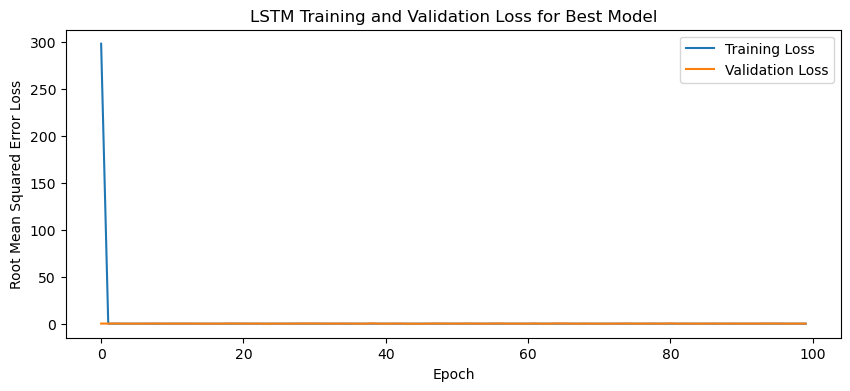

1/1 - 3s - loss: 0.0743 - 3s/epoch - 3s/step
Test Loss: 0.07430887222290039
1/1 [==============================] - 0s 149ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

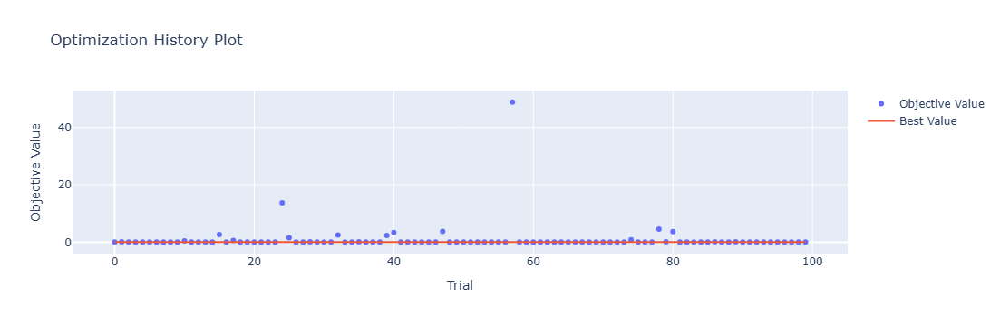

In [4]:
optuna.visualization.plot_optimization_history(study)

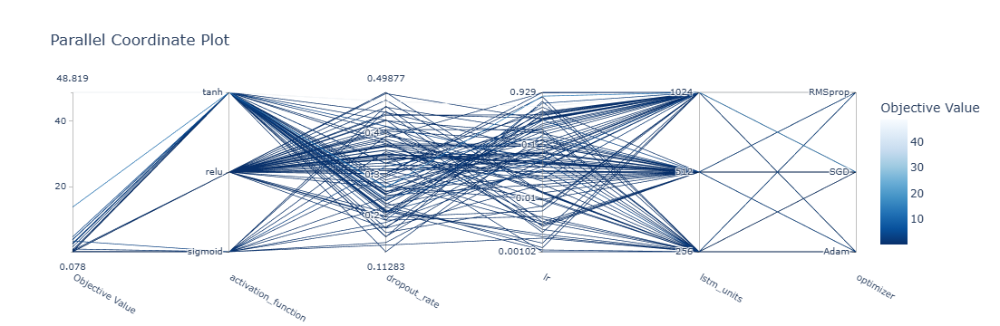

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

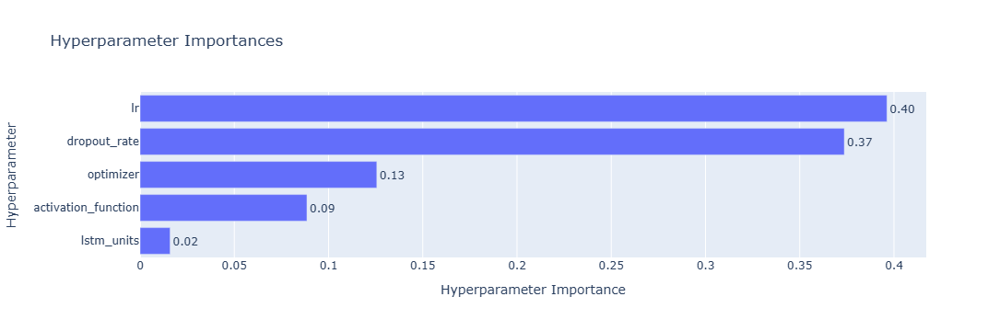

In [6]:
optuna.visualization.plot_param_importances(study)

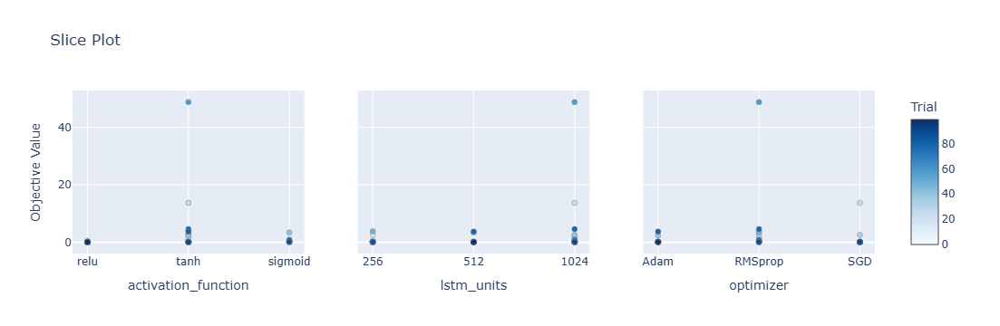

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

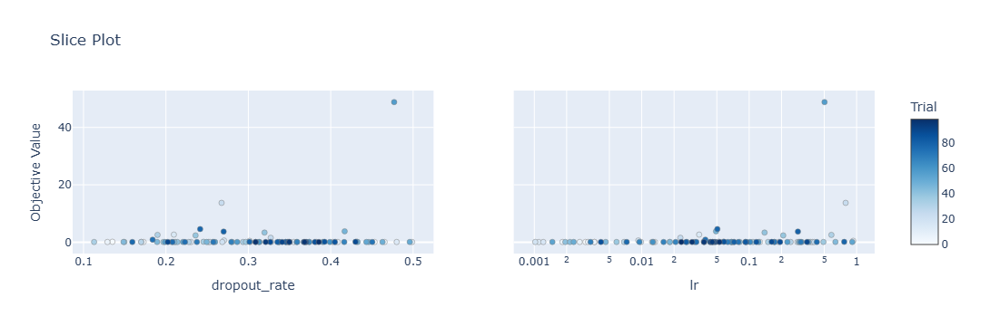

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 51s 356ms/step - loss: 297.4147 - accuracy: 0.6905 - mae: 295.7037 - rmse: 297.4147 - mape: 67945.4609 - pearson: 0.6994 - val_loss: 0.0825 - val_accuracy: 1.0000 - val_mae: 0.0688 - val_rmse: 0.0825 - val_mape: 13.9444 - val_pearson: 0.9162
Epoch 2/100
84/84 [==============================] - 20s 236ms/step - loss: 0.1328 - accuracy: 0.7381 - mae: 0.1145 - rmse: 0.1328 - mape: 21.1780 - pearson: 0.7327 - val_loss: 0.1169 - val_accuracy: 1.0000 - val_mae: 0.1047 - val_rmse: 0.1169 - val_mape: 22.2962 - val_pearson: 0.9280
Epoch 3/100
84/84 [==============================] - 20s 244ms/step - loss: 0.1336 - accuracy: 0.8095 - mae: 0.1116 - rmse: 0.1336 - mape: 20.3947 - pearso

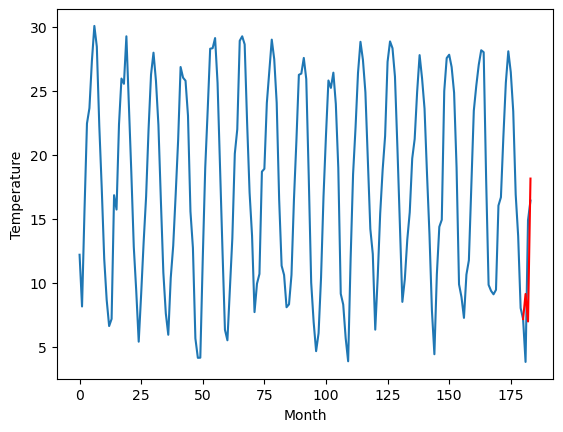

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		16.07		3.20
12.78		13.92		1.14
17.84		25.08		7.24
[180, 181, 182, 183]
[13.23, 16.065769872665406, 13.917664966583253, 25.078357181549073]


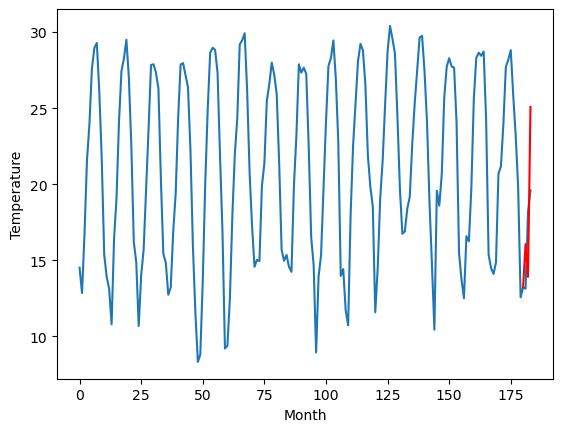

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		18.38		3.04
16.20		16.23		0.03
22.18		27.39		5.21
[180, 181, 182, 183]
[7.18, 18.375769872665405, 16.22766496658325, 27.388357181549072]


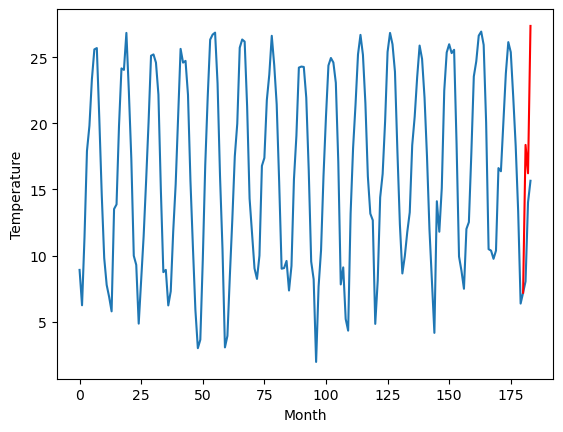

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		12.77		3.77
7.43		10.62		3.19
15.34		21.78		6.44
[180, 181, 182, 183]
[11.46, 12.765769872665405, 10.617664966583252, 21.778357181549072]


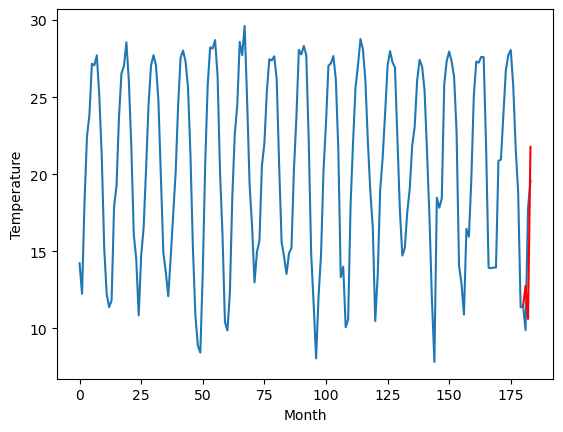

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		18.09		4.74
10.26		15.94		5.68
20.16		27.10		6.94
[180, 181, 182, 183]
[9.27, 18.085769872665406, 15.937664966583252, 27.098357181549073]


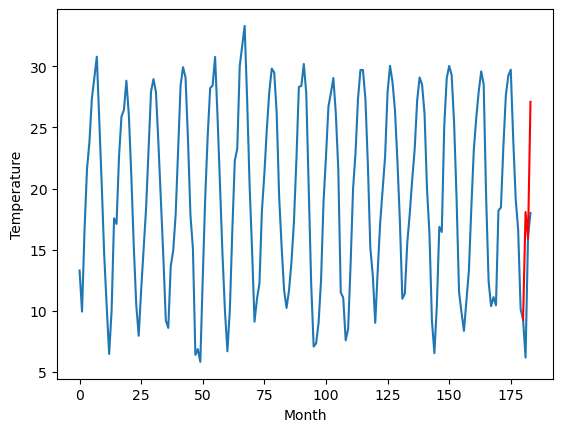

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		17.16		5.64
12.17		15.01		2.84
17.07		26.17		9.10
[180, 181, 182, 183]
[7.77, 17.155769872665406, 15.007664966583253, 26.168357181549073]


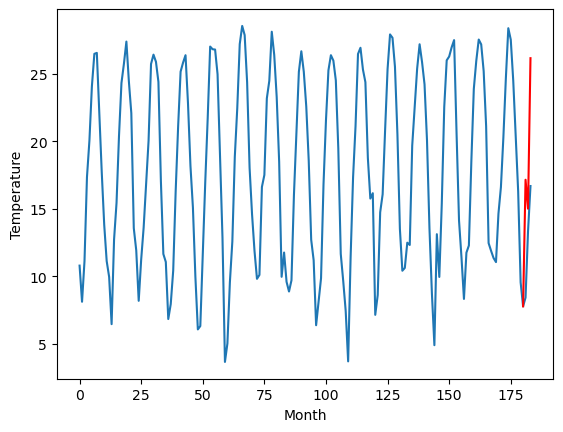

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		14.65		4.44
10.85		12.50		1.65
17.83		23.66		5.83
[180, 181, 182, 183]
[6.59, 14.645769872665404, 12.497664966583251, 23.65835718154907]


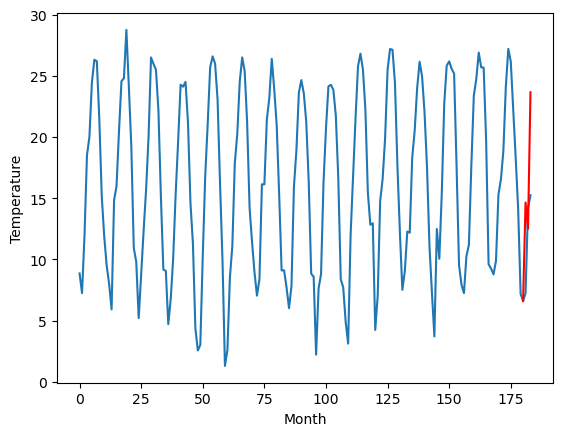

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		12.71		4.80
8.53		10.56		2.03
15.05		21.72		6.67
[180, 181, 182, 183]
[5.3, 12.705769872665405, 10.557664966583252, 21.718357181549074]


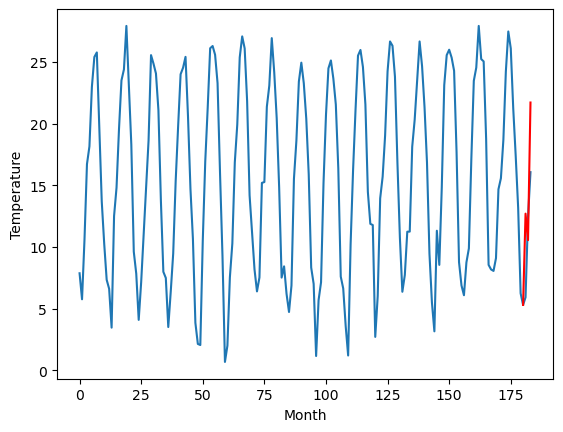

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		11.73		4.65
2.81		9.58		6.77
15.28		20.74		5.46
[180, 181, 182, 183]
[3.1, 11.725769872665406, 9.577664966583253, 20.738357181549073]


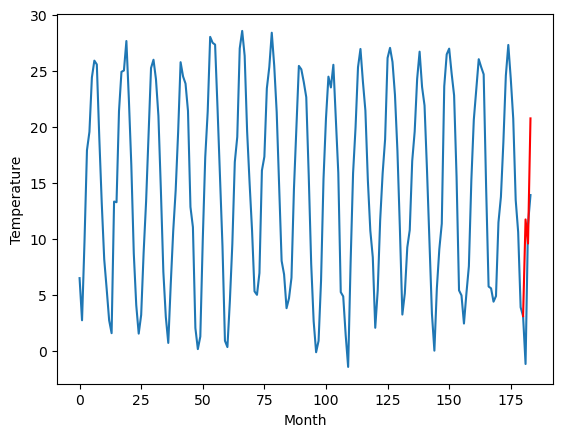

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		10.35		5.45
2.73		8.20		5.47
13.48		19.36		5.88
[180, 181, 182, 183]
[0.6, 10.345769872665405, 8.197664966583252, 19.358357181549074]


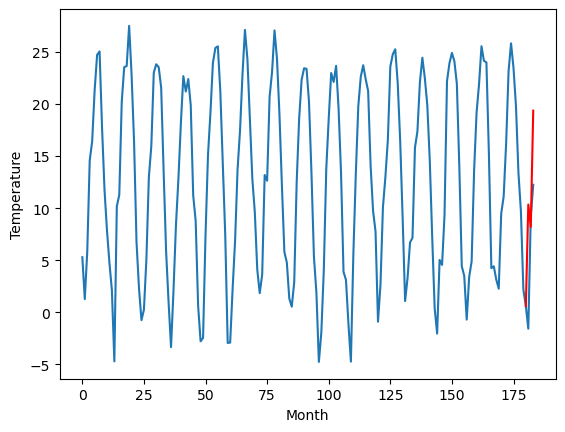

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		9.15		5.47
-0.63		7.00		7.63
11.10		18.16		7.06
[180, 181, 182, 183]
[-0.75, 9.145769872665404, 6.997664966583251, 18.15835718154907]


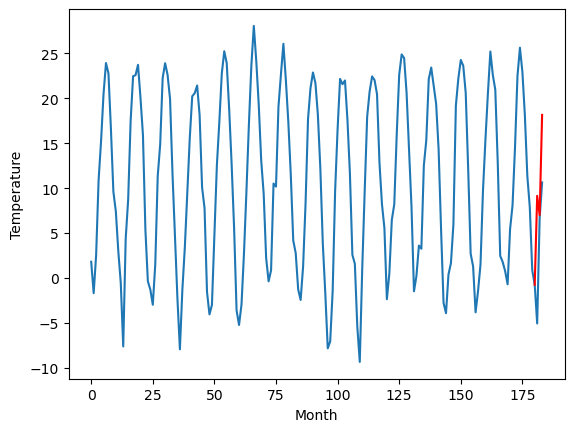

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43    9.14577
1                 1   12.87   16.06577
2                 2   15.34   18.37577
3                 3    9.00   12.76577
4                 4   13.35   18.08577
5                 5   11.52   17.15577
6                 6   10.21   14.64577
7                 7    7.91   12.70577
8                 8    7.08   11.72577
9                 9    4.90   10.34577
10               10    3.68    9.14577


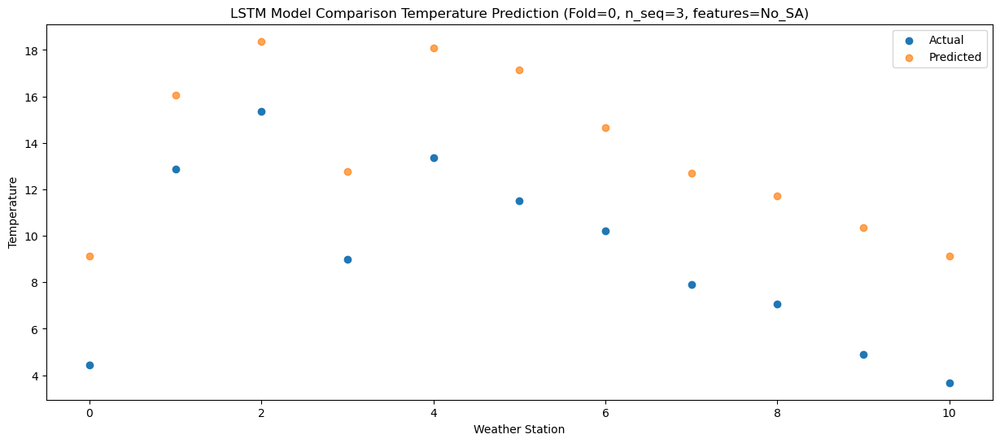

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   6.997665
1                 1   12.78  13.917665
2                 2   16.20  16.227665
3                 3    7.43  10.617665
4                 4   10.26  15.937665
5                 5   12.17  15.007665
6                 6   10.85  12.497665
7                 7    8.53  10.557665
8                 8    2.81   9.577665
9                 9    2.73   8.197665
10               10   -0.63   6.997665


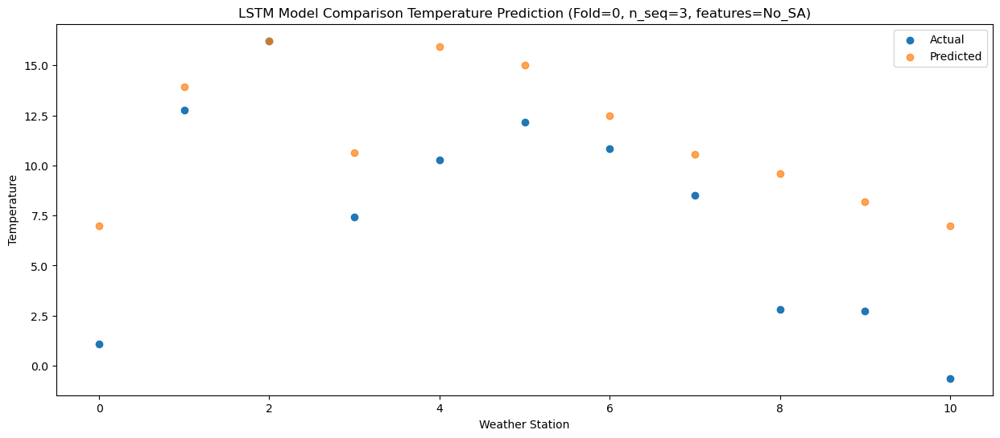

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  18.158357
1                 1   17.84  25.078357
2                 2   22.18  27.388357
3                 3   15.34  21.778357
4                 4   20.16  27.098357
5                 5   17.07  26.168357
6                 6   17.83  23.658357
7                 7   15.05  21.718357
8                 8   15.28  20.738357
9                 9   13.48  19.358357
10               10   11.10  18.158357


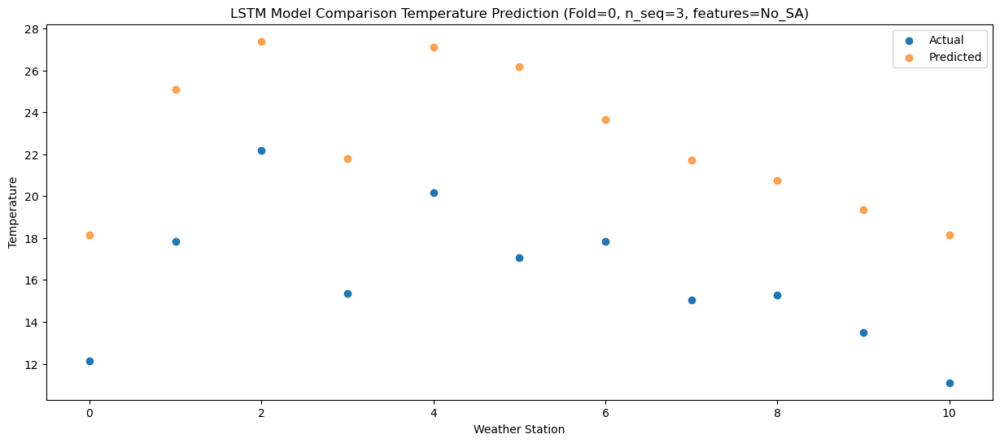

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]]
[[ 9.14576987 16.06576987 18.37576987 12.76576987 18.08576987 17.15576987
  14.64576987 12.70576987 11.72576987 10.34576987  9.14576987]
 [ 6.99766497 13.91766497 16.22766497 10.61766497 15.93766497 15.00766497
  12.49766497 10.55766497  9.57766497  8.19766497  6.99766497]
 [18.15835718 25.07835718 27.38835718 21.77835718 27.09835718 26.16835718
  23.65835718 21.71835718 20.73835718 19.35835718 18.15835718]]
Year at t+1:
t+1 SKRMSE: 4.610536
t+1 KRMSE: 4.610536
t+1 MAE: 4.533952
t+1 SKMAPE: 0.642424
t+1 R2_SCORE: -0.531989
t+1 KMAPE: 0.642424
t+1 PEARSON: 0.959594
t+1 AVERAGE ACTUAL: 9.117273
Year at t+2:
t+2 SKRMSE: 4.547401
t+2 KRMSE: 4.547401
t+2 MAE: 3.847665
t+2 SKMAPE: 2.153984
t+2 R2_SCORE: 0.234322
t+2 KMAPE: -0.047362
t+2 PEARSON: 0.875932
t+2 AVERAGE ACTUAL: 7.65545

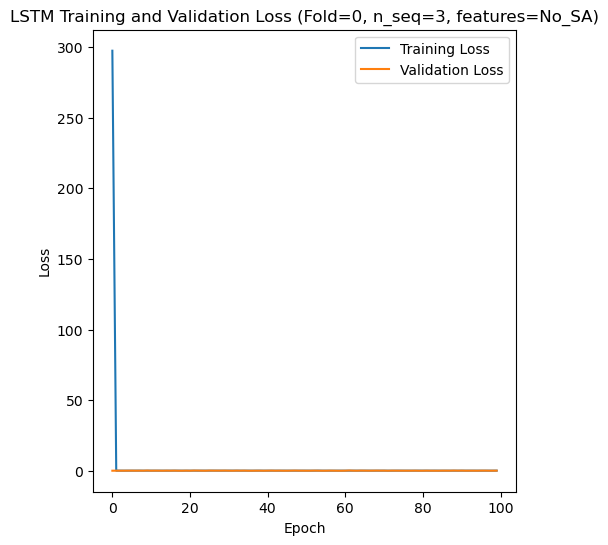

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 61s 342ms/step - loss: 224.9578 - accuracy: 0.5238 - mae: 223.6757 - rmse: 224.9578 - mape: 44191.7812 - pearson: 0.6467 - val_loss: 0.1339 - val_accuracy: 0.9000 - val_mae: 0.1253 - val_rmse: 0.1339 - val_mape: 24.7421 - val_pearson: 0.8386
Epoch 2/100
84/84 [==============================] - 20s 243ms/step - loss: 2.0014 - accuracy: 0.8929 - mae: 1.9759 - rmse: 2.0014 - mape: 395.7381 - pearson: 0.8227 - val_loss: 0.1842 - val_accuracy: 0.9000 - val_mae: 0.1573 - val_rmse: 0.1842 - val_mape: 26.5862 - val_pearson: 0.8596
Epoch 3/100
84/84 [==============================] - 21s 247ms/step - loss: 0.1313 - accuracy: 0.8214 - mae: 0.1114 - rmse: 0.1313 - mape: 21.4745 - pears

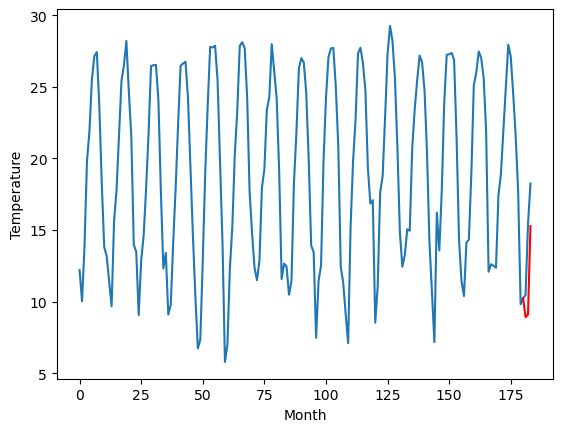

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		13.16		1.16
12.66		13.34		0.68
19.43		19.52		0.09
[180, 181, 182, 183]
[6.41, 13.160845589637756, 13.344369661808013, 19.517605555057525]


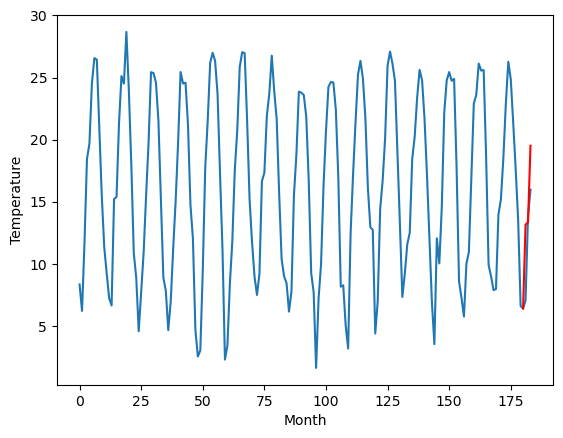

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		9.31		0.54
9.26		9.49		0.23
16.32		15.67		-0.65
[180, 181, 182, 183]
[7.6, 9.310845589637756, 9.494369661808014, 15.667605555057525]


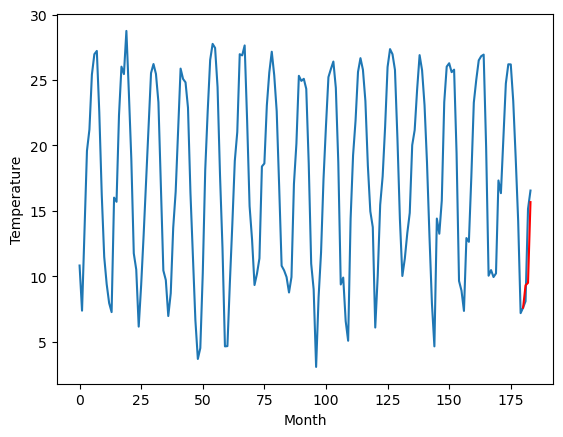

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		11.78		1.06
9.13		11.96		2.83
16.50		18.14		1.64
[180, 181, 182, 183]
[11.89, 11.780845589637757, 11.964369661808014, 18.137605555057526]


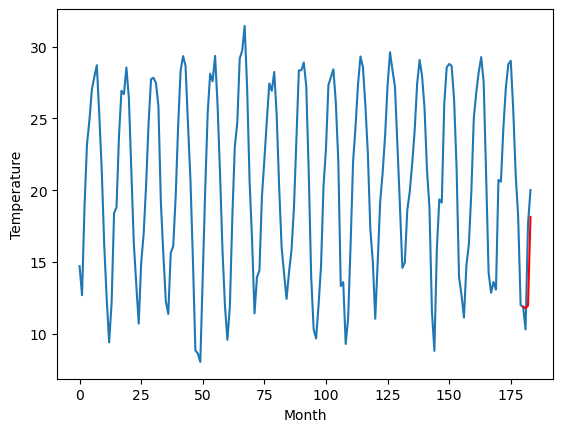

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		15.67		0.97
13.00		15.85		2.85
20.61		22.03		1.42
[180, 181, 182, 183]
[10.96, 15.670845589637757, 15.854369661808015, 22.027605555057526]


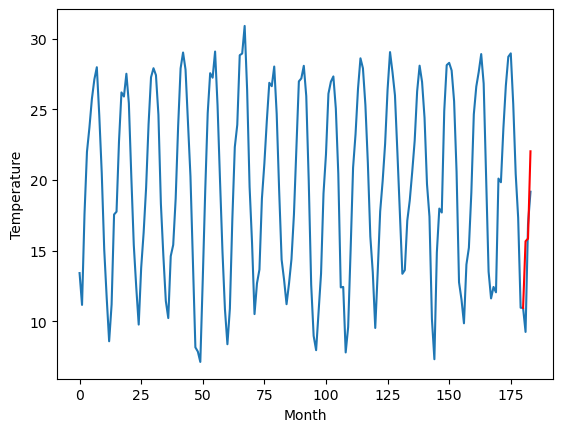

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		14.38		2.47
12.29		14.56		2.27
19.63		20.74		1.11
[180, 181, 182, 183]
[7.75, 14.380845589637756, 14.564369661808014, 20.737605555057527]


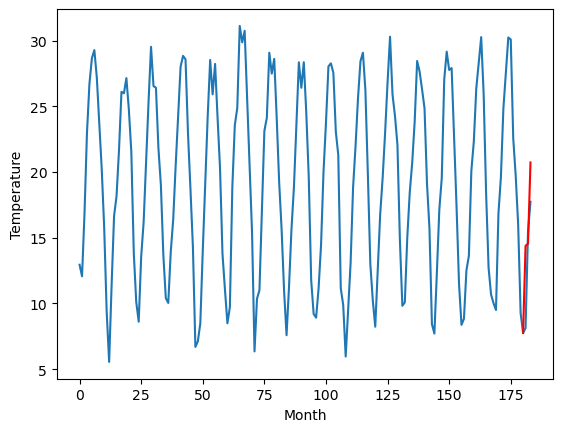

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		13.91		1.16
13.53		14.09		0.56
19.81		20.27		0.46
[180, 181, 182, 183]
[6.17, 13.910845589637756, 14.094369661808013, 20.267605555057525]


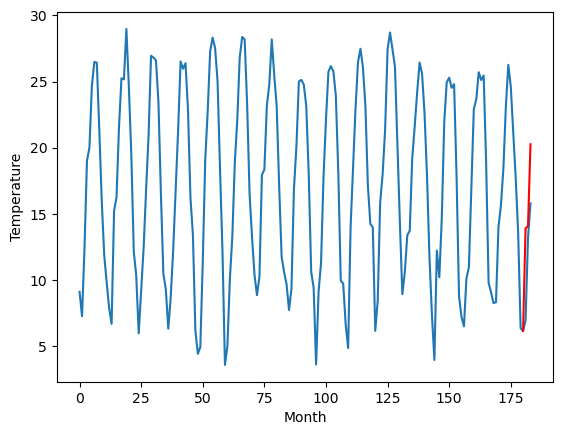

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		10.08		1.27
5.81		10.26		4.45
17.13		16.44		-0.69
[180, 181, 182, 183]
[4.57, 10.080845589637756, 10.264369661808013, 16.437605555057523]


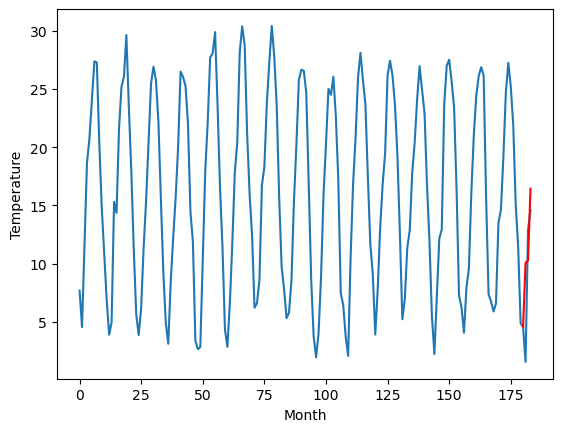

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		8.65		1.31
2.56		8.83		6.27
15.12		15.01		-0.11
[180, 181, 182, 183]
[5.46, 8.650845589637758, 8.834369661808015, 15.007605555057527]


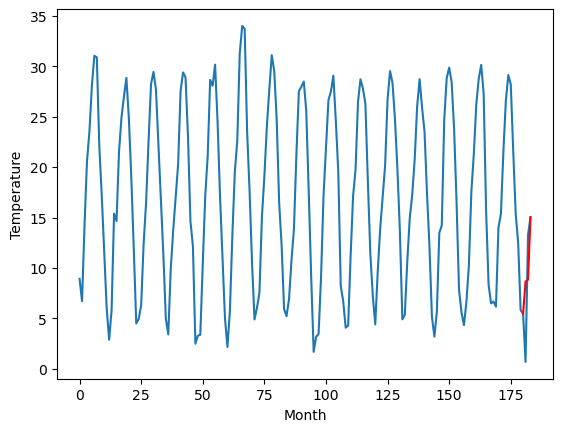

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		9.89		0.85
4.67		10.07		5.40
15.38		16.25		0.87
[180, 181, 182, 183]
[5.42, 9.890845589637756, 10.074369661808014, 16.247605555057525]


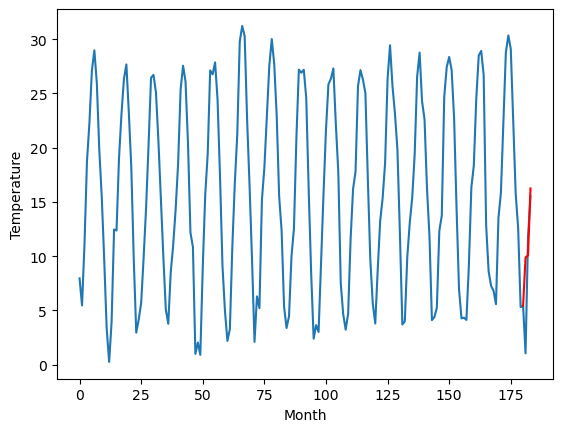

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		8.92		2.80
5.16		9.10		3.94
12.38		15.28		2.90
[180, 181, 182, 183]
[2.17, 8.920845589637757, 9.104369661808015, 15.277605555057526]


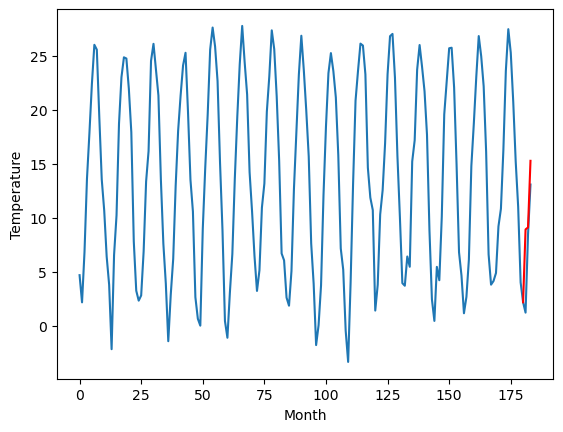

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   8.920846
1                 1   12.00  13.160846
2                 2    8.77   9.310846
3                 3   10.72  11.780846
4                 4   14.70  15.670846
5                 5   11.91  14.380846
6                 6   12.75  13.910846
7                 7    8.81  10.080846
8                 8    7.34   8.650846
9                 9    9.04   9.890846
10               10    6.12   8.920846


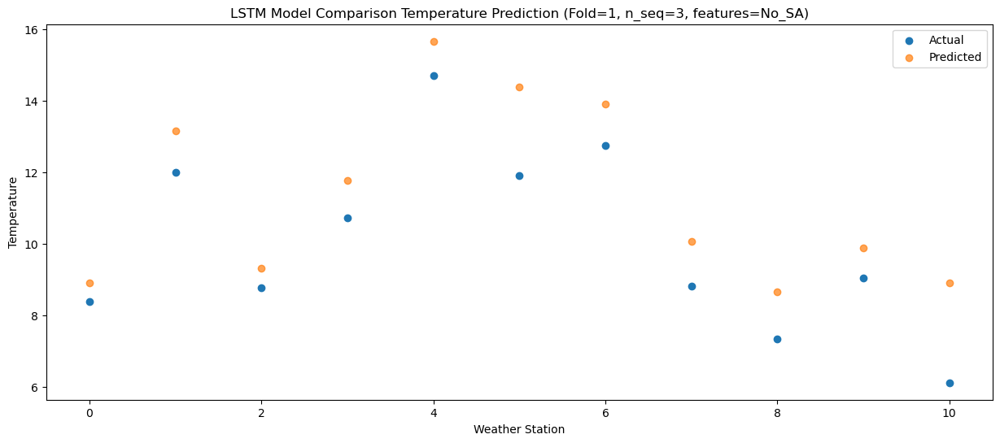

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60    9.10437
1                 1   12.66   13.34437
2                 2    9.26    9.49437
3                 3    9.13   11.96437
4                 4   13.00   15.85437
5                 5   12.29   14.56437
6                 6   13.53   14.09437
7                 7    5.81   10.26437
8                 8    2.56    8.83437
9                 9    4.67   10.07437
10               10    5.16    9.10437


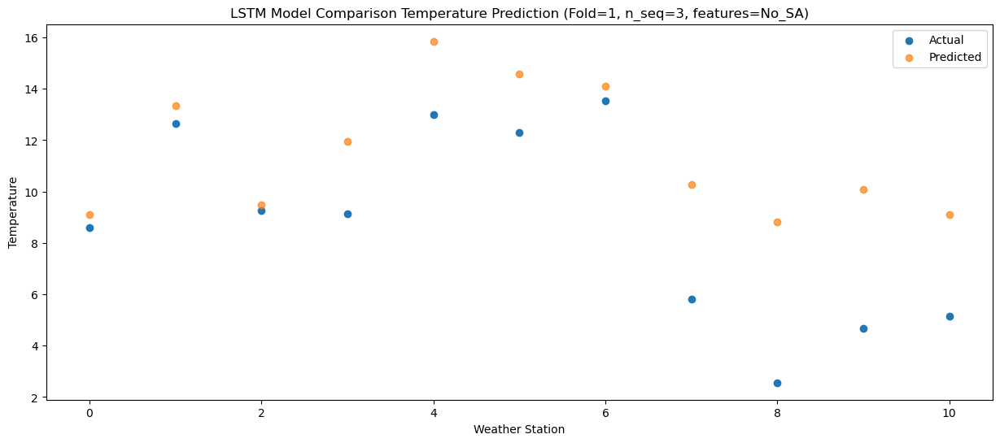

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  15.277606
1                 1   19.43  19.517606
2                 2   16.32  15.667606
3                 3   16.50  18.137606
4                 4   20.61  22.027606
5                 5   19.63  20.737606
6                 6   19.81  20.267606
7                 7   17.13  16.437606
8                 8   15.12  15.007606
9                 9   15.38  16.247606
10               10   12.38  15.277606


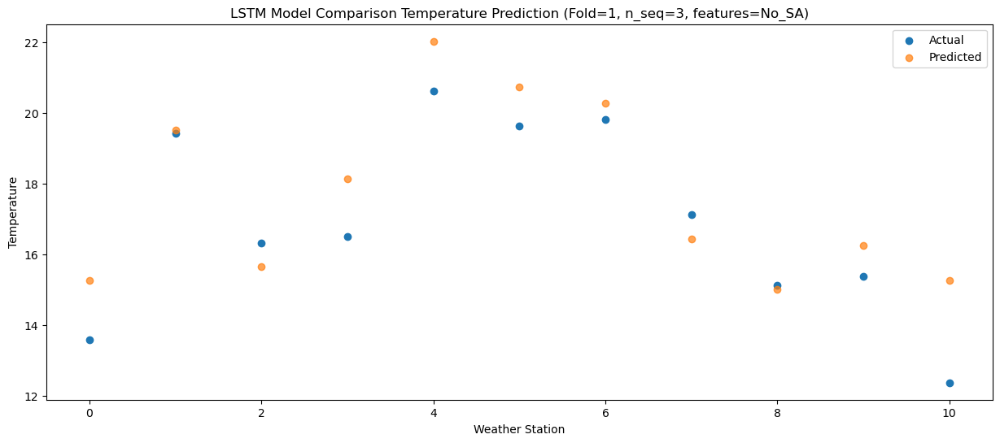

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]]
[[ 8.92084559 13.16084559  9.31084559 11.78084559 15.67084559 14.38084559
  13.91084559 10.08084559  8.65084559  9.89084559  8.92084559]
 [ 9.10436966 13.34436966  9.49436966 11.96436966 15.85436966 14.56436966
  14.09436966 10.26436966  8.83436966 10.07436966  9.10436966]
 [15.27760556 19.51760556 15.66760556 18.13760556 22.02760556 20.73760556
  20.26760556 16.43760556 15.00760556 16.24760556 15.27760556]]
Year at t+1:
t+1 SKRMSE: 1.457121
t+1 KRMSE: 1.457121
t+1 MAE: 1.285391
t+1 SKMAPE: 0.141916
t+1 R2_SCORE: 0.648252
t+1 KMAPE: 0.141916
t+1 PEARSON: 0.922746
t+1 AVERAGE ACTUAL: 10.049091
Year at t+2:
t+2 SKRMSE: 3.390152
t+2 KRMSE: 3.390152
t+2 MAE: 2.729824
t+2 SKMAPE: 0.548551
t+2 R2_SCORE: 0.131914
t+2 KMAPE: 0.548551
t+2 PEARSON: 0.729681
t+2 AVERAGE ACTUAL: 8.788182

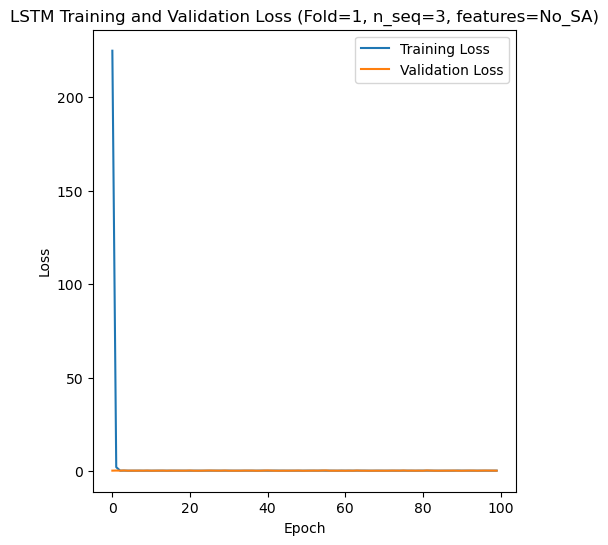

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 61s 335ms/step - loss: 285.5165 - accuracy: 0.8571 - mae: 283.8798 - rmse: 285.5165 - mape: 53500.5430 - pearson: 0.7807 - val_loss: 0.0520 - val_accuracy: 1.0000 - val_mae: 0.0452 - val_rmse: 0.0520 - val_mape: 8.0179 - val_pearson: 0.9777
Epoch 2/100
84/84 [==============================] - 20s 238ms/step - loss: 0.1084 - accuracy: 0.8810 - mae: 0.0943 - rmse: 0.1084 - mape: 17.2419 - pearson: 0.8407 - val_loss: 0.0886 - val_accuracy: 1.0000 - val_mae: 0.0804 - val_rmse: 0.0886 - val_mape: 15.5098 - val_pearson: 0.9714
Epoch 3/100
84/84 [==============================] - 21s 255ms/step - loss: 0.1040 - accuracy: 0.8571 - mae: 0.0903 - rmse: 0.1040 - mape: 16.5985 - pearson

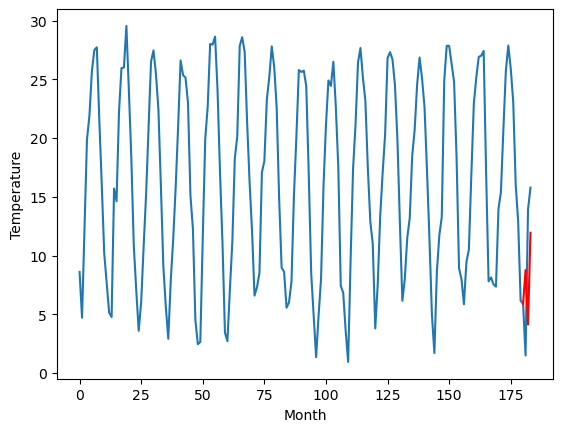

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.81		0.28
4.49		4.17		-0.32
14.68		11.99		-2.69
[180, 181, 182, 183]
[2.63, 8.808265135288238, 4.171883032321929, 11.987448141574859]


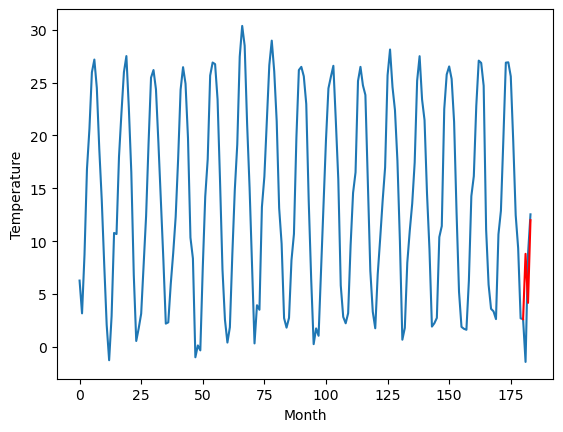

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		6.48		-0.46
9.67		1.84		-7.83
11.48		9.66		-1.82
[180, 181, 182, 183]
[16.55, 6.478265135288239, 1.8418830323219302, 9.65744814157486]


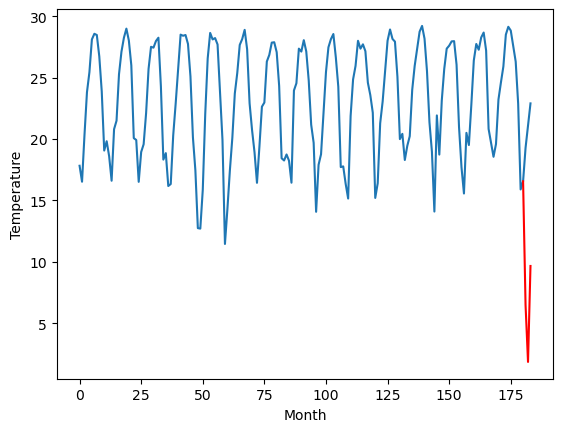

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		18.02		3.28
14.76		13.38		-1.38
18.87		21.20		2.33
[180, 181, 182, 183]
[-0.83, 18.01826513528824, 13.38188303232193, 21.19744814157486]


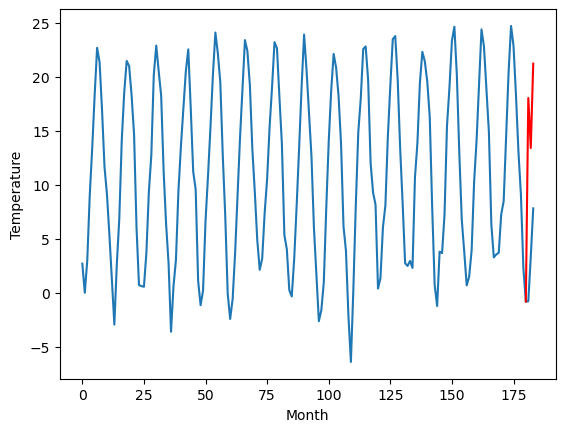

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		2.88		-0.15
2.29		-1.76		-4.05
9.62		6.06		-3.56
[180, 181, 182, 183]
[11.52, 2.8782651352882387, -1.75811696767807, 6.057448141574859]


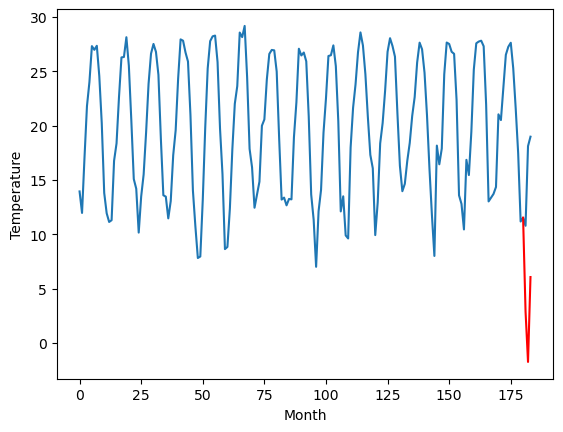

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.14		0.79
11.00		9.50		-1.50
19.38		17.32		-2.06
[180, 181, 182, 183]
[11.47, 14.138265135288238, 9.50188303232193, 17.317448141574857]


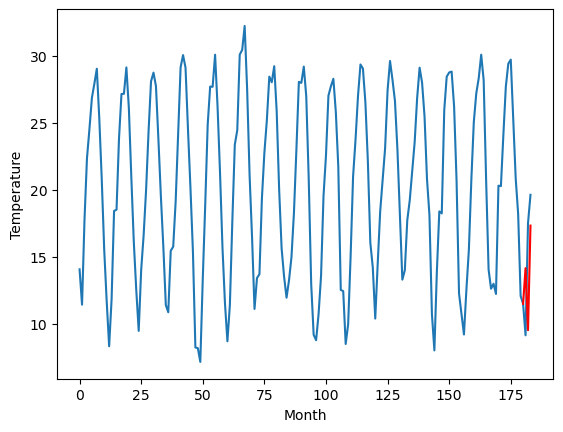

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.25		0.90
10.24		9.61		-0.63
20.61		17.43		-3.18
[180, 181, 182, 183]
[7.75, 14.24826513528824, 9.61188303232193, 17.42744814157486]


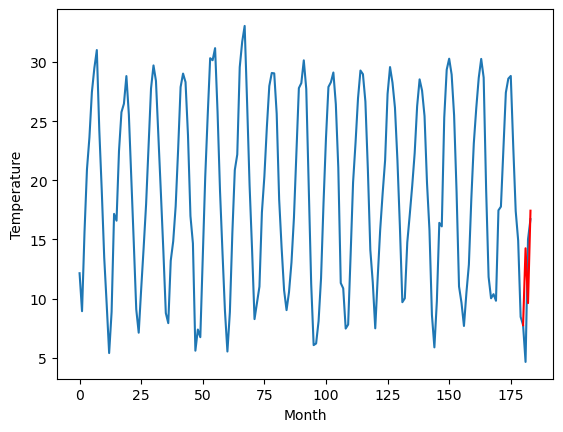

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		12.34		-0.34
15.60		7.70		-7.90
18.70		15.52		-3.18
[180, 181, 182, 183]
[4.9, 12.338265135288239, 7.7018830323219305, 15.51744814157486]


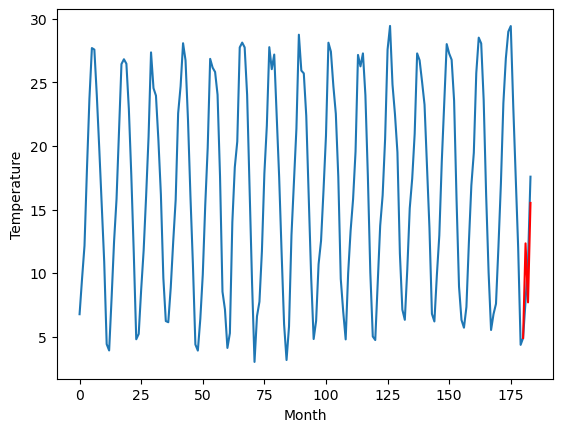

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		6.97		0.26
5.79		2.33		-3.46
5.39		10.15		4.76
[180, 181, 182, 183]
[14.14, 6.968265135288238, 2.3318830323219295, 10.14744814157486]


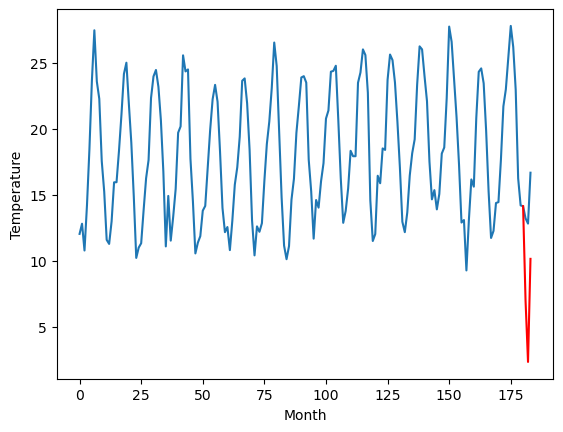

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		12.24		0.61
12.13		7.60		-4.53
19.01		15.42		-3.59
[180, 181, 182, 183]
[5.55, 12.238265135288238, 7.601883032321929, 15.417448141574859]


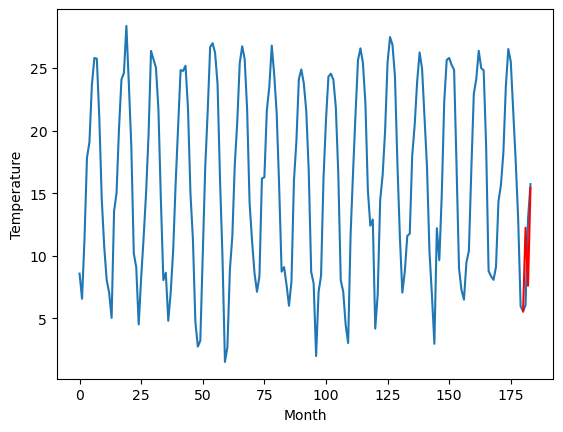

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		8.77		-0.13
10.25		4.13		-6.12
16.46		11.95		-4.51
[180, 181, 182, 183]
[3.19, 8.768265135288239, 4.13188303232193, 11.94744814157486]


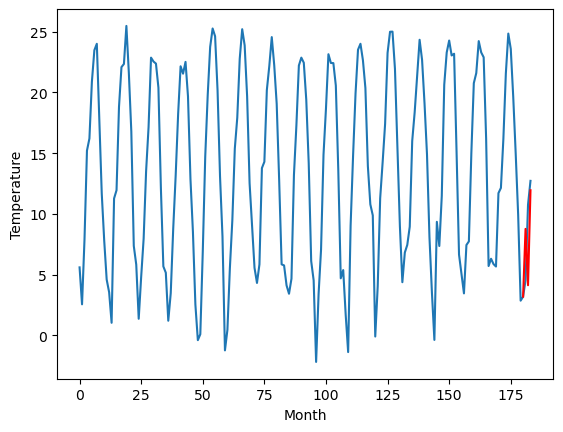

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   8.768265
1                 1    8.53   8.808265
2                 2    6.94   6.478265
3                 3   14.74  18.018265
4                 4    3.03   2.878265
5                 5   13.35  14.138265
6                 6   13.35  14.248265
7                 7   12.68  12.338265
8                 8    6.71   6.968265
9                 9   11.63  12.238265
10               10    8.90   8.768265


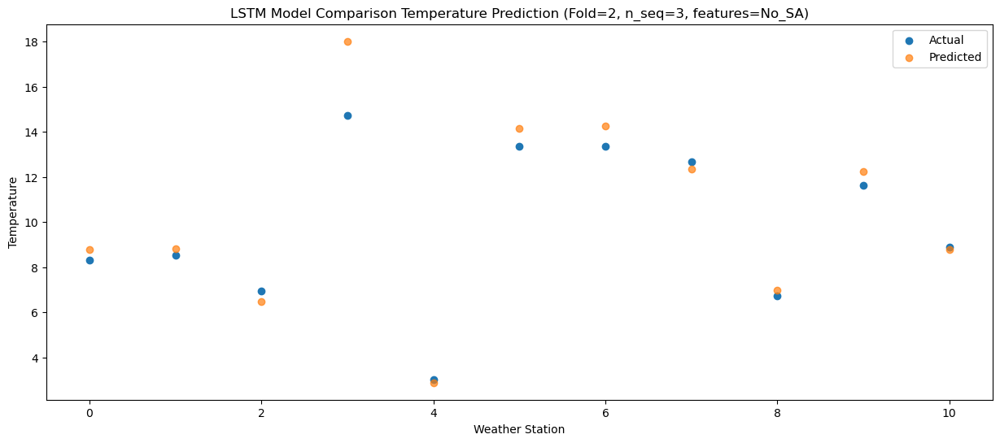

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   4.131883
1                 1    4.49   4.171883
2                 2    9.67   1.841883
3                 3   14.76  13.381883
4                 4    2.29  -1.758117
5                 5   11.00   9.501883
6                 6   10.24   9.611883
7                 7   15.60   7.701883
8                 8    5.79   2.331883
9                 9   12.13   7.601883
10               10   10.25   4.131883


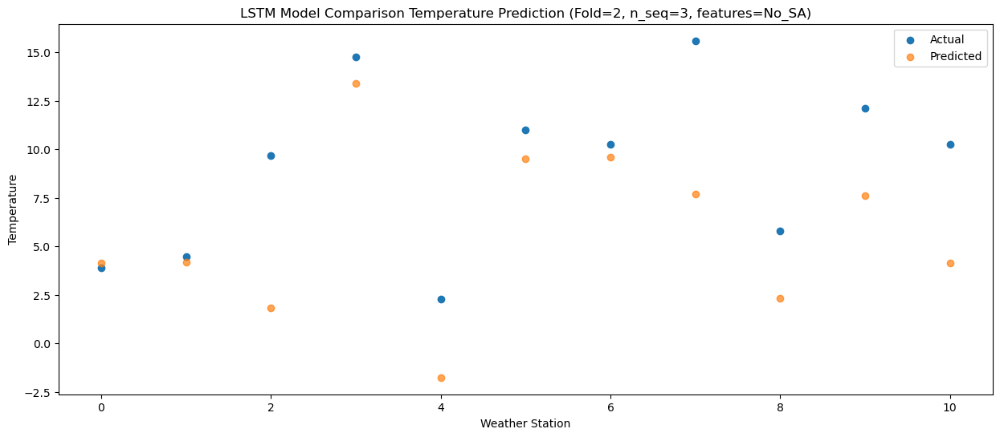

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  11.947448
1                 1   14.68  11.987448
2                 2   11.48   9.657448
3                 3   18.87  21.197448
4                 4    9.62   6.057448
5                 5   19.38  17.317448
6                 6   20.61  17.427448
7                 7   18.70  15.517448
8                 8    5.39  10.147448
9                 9   19.01  15.417448
10               10   16.46  11.947448


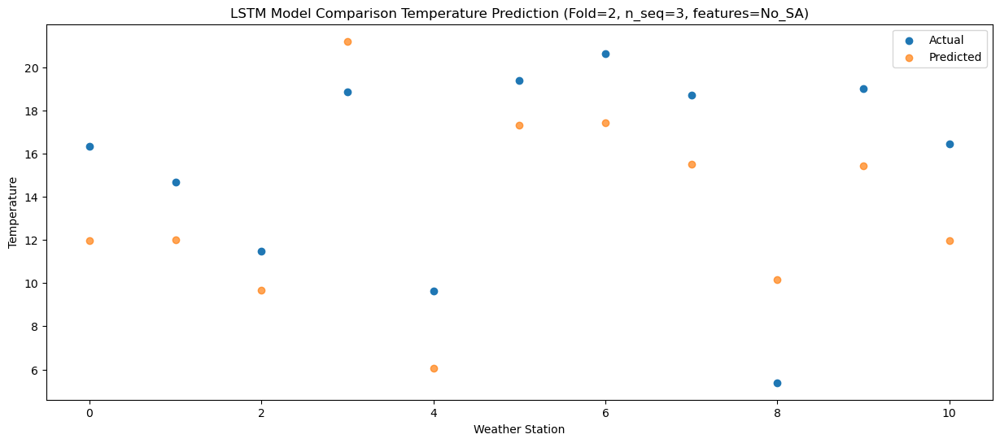

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]]
[[ 8.76826514  8.80826514  6.47826514 18.01826514  2.87826514 14.13826514
  14.24826514 12.33826514  6.96826514 12.23826514  8.76826514]
 [ 4.13188303  4.17188303  1.84188303 13.38188303 -1.75811697  9.50188303
   9.61188303  7.70188303  2.33188303  7.60188303  4.13188303]
 [11.94744814 11.98744814  9.65744814 21.19744814  6.05744814 17.31744814
  17.42744814 15.51744814 10.14744814 15.41744814 11.94744814]]
Year at t+1:
t+1 SKRMSE: 1.098336
t+1 KRMSE: 1.098336
t+1 MAE: 0.695890
t+1 SKMAPE: 0.062333
t+1 R2_SCORE: 0.897486
t+1 KMAPE: 0.062333
t+1 PEARSON: 0.964758
t+1 AVERAGE ACTUAL: 9.833636
Year at t+2:
t+2 SKRMSE: 4.417210
t+2 KRMSE: 4.417210
t+2 MAE: 3.447550
t+2 SKMAPE: 0.460863
t+2 R2_SCORE: -0.097602
t+2 KMAPE: 0.460863
t+2 PEARSON: 0.596189
t+2 AVERAGE ACTUAL: 9.102727

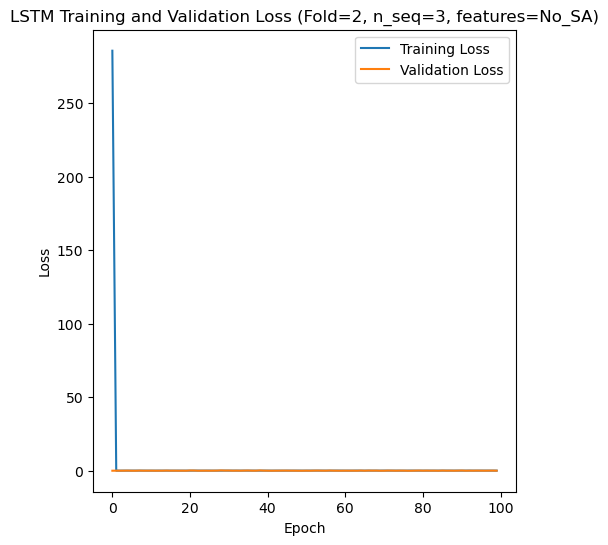

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 61s 346ms/step - loss: 241.2330 - accuracy: 0.7857 - mae: 240.2832 - rmse: 241.2330 - mape: 47028.3320 - pearson: 0.6966 - val_loss: 0.1575 - val_accuracy: 0.8000 - val_mae: 0.1409 - val_rmse: 0.1575 - val_mape: 30.2054 - val_pearson: 0.7608
Epoch 2/100
84/84 [==============================] - 20s 244ms/step - loss: 0.1406 - accuracy: 0.8333 - mae: 0.1234 - rmse: 0.1406 - mape: 23.8681 - pearson: 0.7610 - val_loss: 0.1080 - val_accuracy: 0.8000 - val_mae: 0.0841 - val_rmse: 0.1080 - val_mape: 19.8907 - val_pearson: 0.7694
Epoch 3/100
84/84 [==============================] - 20s 242ms/step - loss: 0.1219 - accuracy: 0.8810 - mae: 0.1029 - rmse: 0.1219 - mape: 19.2888 - pearso

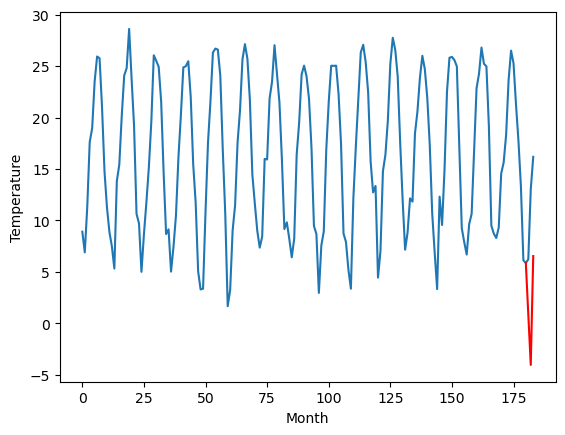

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		6.54		-1.21
4.03		1.65		-2.38
16.00		12.23		-3.77
[180, 181, 182, 183]
[3.2, 6.544773244857788, 1.652003908157349, 12.23125138282776]


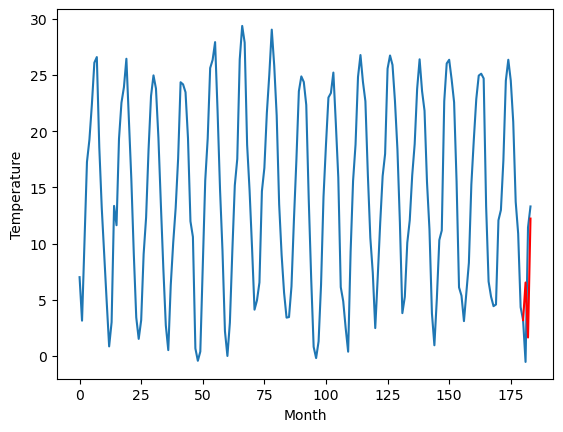

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		4.66		-3.62
10.58		-0.23		-10.81
11.73		10.35		-1.38
[180, 181, 182, 183]
[8.48, 4.664773244857788, -0.2279960918426518, 10.351251382827758]


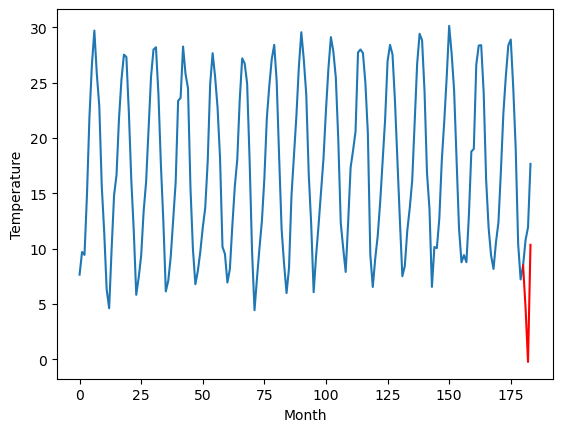

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		5.29		-0.90
4.87		0.40		-4.47
15.08		10.98		-4.10
[180, 181, 182, 183]
[1.55, 5.294773244857788, 0.402003908157349, 10.98125138282776]


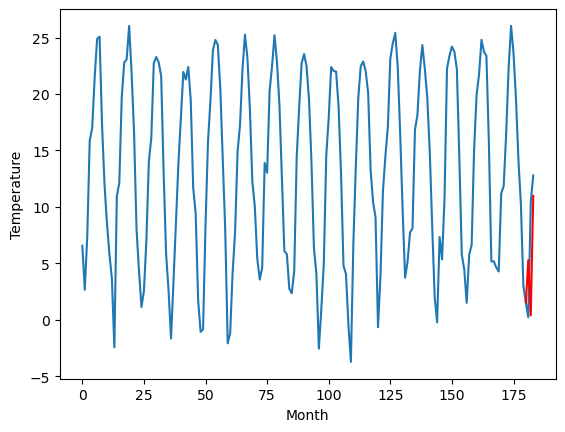

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		4.21		-0.89
1.23		-0.68		-1.91
14.31		9.90		-4.41
[180, 181, 182, 183]
[1.08, 4.214773244857788, -0.6779960918426511, 9.901251382827759]


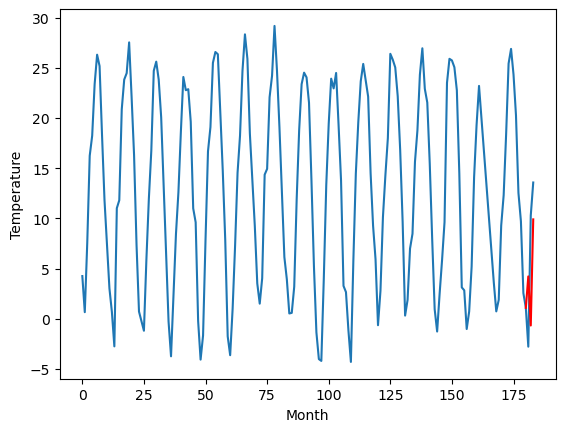

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		1.89		-0.91
0.08		-3.00		-3.08
11.41		7.58		-3.83
[180, 181, 182, 183]
[0.21, 1.894773244857788, -2.9979960918426514, 7.581251382827759]


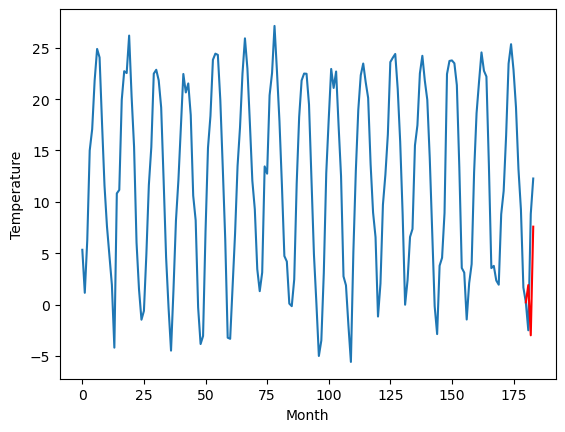

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		2.97		-2.63
5.70		-1.92		-7.62
8.67		8.66		-0.01
[180, 181, 182, 183]
[-8.22, 2.974773244857788, -1.9179960918426513, 8.661251382827759]


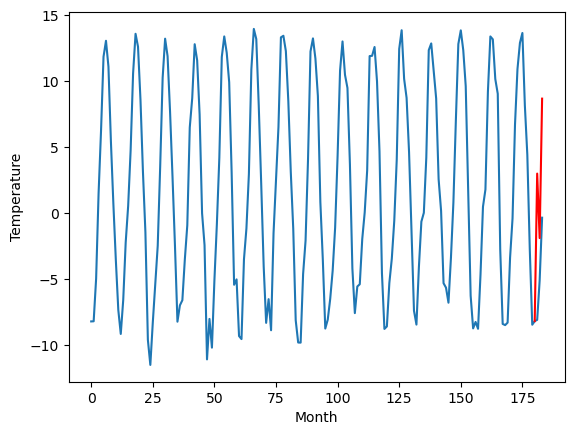

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-10.60		-2.91
-4.84		-15.49		-10.65
-3.24		-4.91		-1.67
[180, 181, 182, 183]
[10.04, -10.595226755142212, -15.487996091842652, -4.908748617172241]


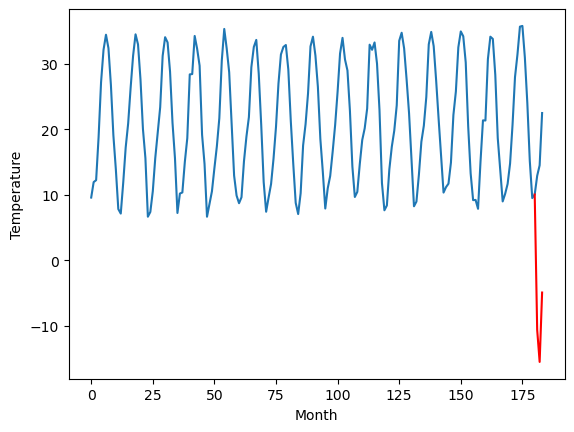

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		7.21		-3.58
11.72		2.32		-9.40
11.50		12.90		1.40
[180, 181, 182, 183]
[9.17, 7.214773244857788, 2.322003908157349, 12.901251382827759]


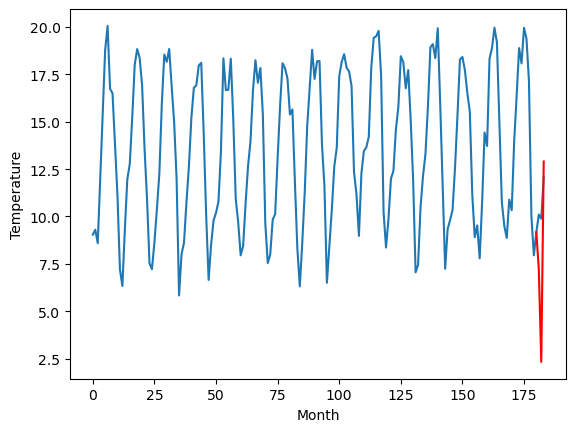

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		6.68		0.66
5.90		1.79		-4.11
10.90		12.37		1.47
[180, 181, 182, 183]
[0.94, 6.684773244857787, 1.7920039081573478, 12.371251382827758]


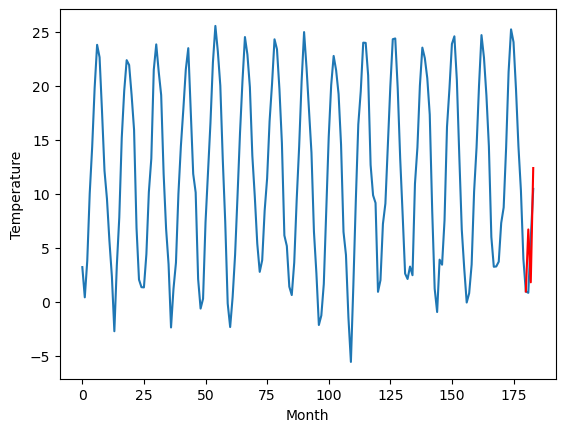

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		0.84		-0.80
0.84		-4.05		-4.89
8.03		6.53		-1.50
[180, 181, 182, 183]
[-0.13, 0.8447732448577883, -4.047996091842651, 6.531251382827759]


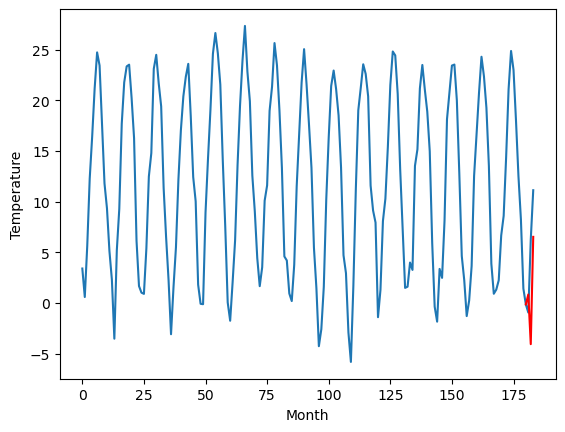

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   0.844773
1                 1    7.75   6.544773
2                 2    8.28   4.664773
3                 3    6.19   5.294773
4                 4    5.10   4.214773
5                 5    2.80   1.894773
6                 6    5.60   2.974773
7                 7   -7.69 -10.595227
8                 8   10.79   7.214773
9                 9    6.02   6.684773
10               10    1.64   0.844773


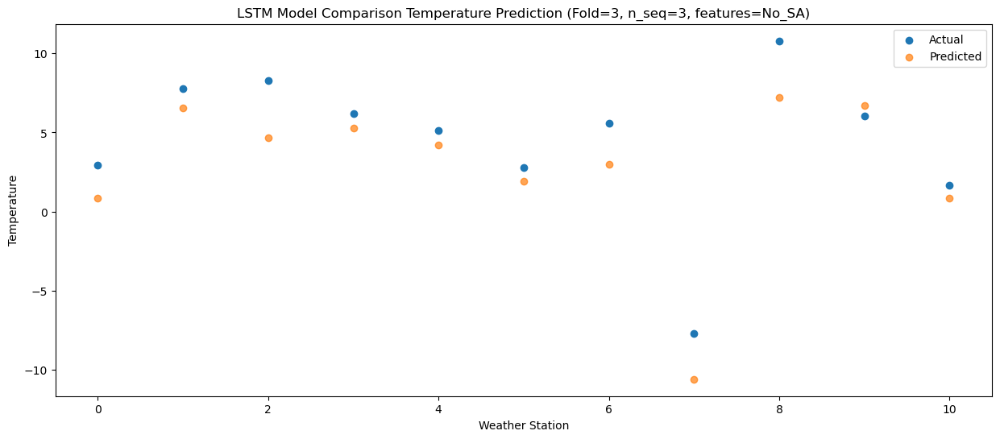

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29  -4.047996
1                 1    4.03   1.652004
2                 2   10.58  -0.227996
3                 3    4.87   0.402004
4                 4    1.23  -0.677996
5                 5    0.08  -2.997996
6                 6    5.70  -1.917996
7                 7   -4.84 -15.487996
8                 8   11.72   2.322004
9                 9    5.90   1.792004
10               10    0.84  -4.047996


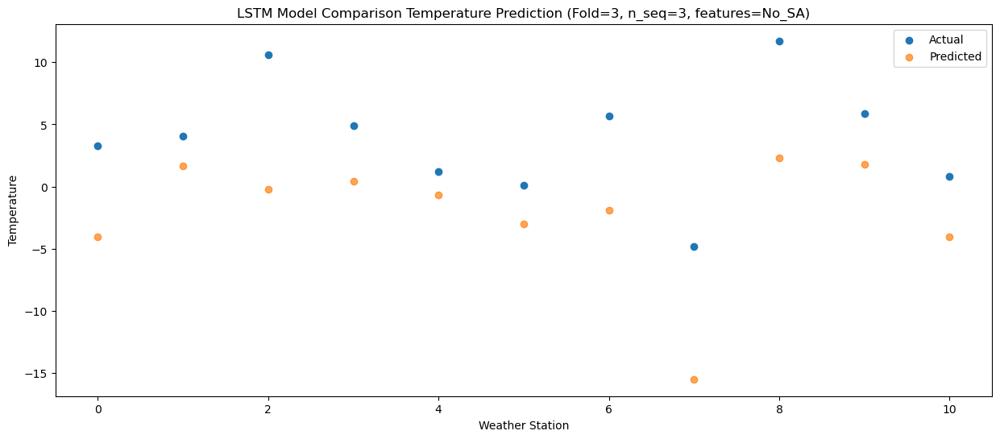

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   6.531251
1                 1   16.00  12.231251
2                 2   11.73  10.351251
3                 3   15.08  10.981251
4                 4   14.31   9.901251
5                 5   11.41   7.581251
6                 6    8.67   8.661251
7                 7   -3.24  -4.908749
8                 8   11.50  12.901251
9                 9   10.90  12.371251
10               10    8.03   6.531251


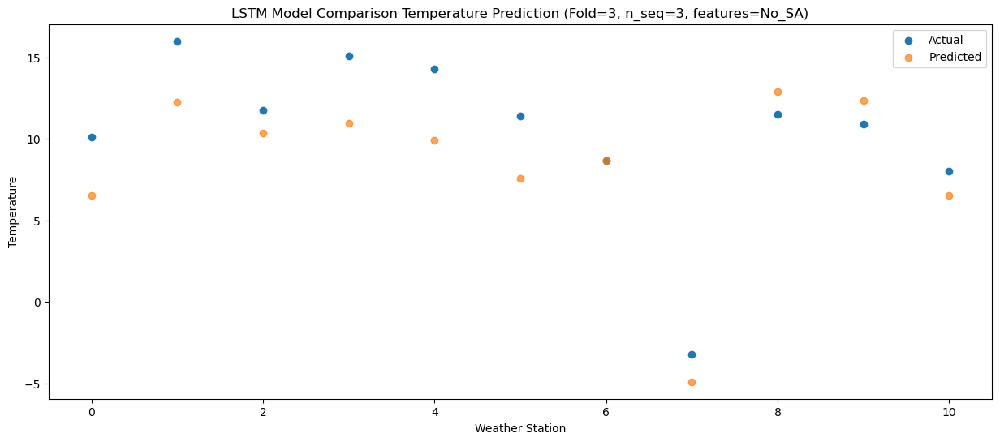

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]]
[[  0.84477324   6.54477324   4.66477324   5.29477324   4.21477324
    1.89477324   2.97477324 -10.59522676   7.21477324   6.68477324
    0.84477324]
 [ -4.04799609   1.65200391  -0.22799609   0.40200391  -0.67799609
   -2.99799609  -1.91799609 -15.48799609   2.32200391   1.79200391
   -4.04799609]
 [  6.53125138  12.23125138  10.35125138  10.98125138   9.90125138
    7.58125138   8.66125138  -4.90874862  12.90125138  12.37125138
    6.53125138]]
Year at t+1:
t+1 SKRMSE: 2.140990
t+1 KRMSE: 2.140990
t+1 MAE: 1.831549
t+1 SKMAPE: 0.337961
t+1 R2_SCORE: 0.783886
t+1 KMAPE: 0.269272
t+1 PEARSON: 0.926602
t+1 AVERAGE ACTUAL: 4.490909
Year at t+2:
t+2 SKRMSE: 6.808387
t+2 KRMSE: 6.808387
t+2 MAE: 6.057996
t+2 SKMAPE: 5.058120
t+2 R2_SCORE: -1.298955
t+2 KMAPE: 4.658120
t+2 PEARSON

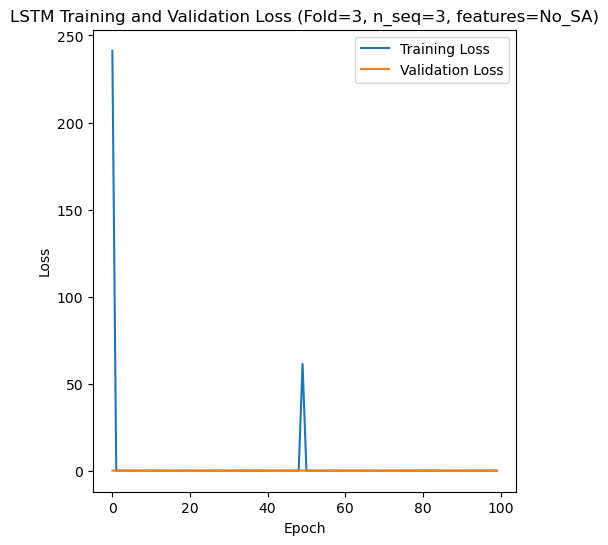

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 61s 342ms/step - loss: 205.4561 - accuracy: 0.7262 - mae: 205.2671 - rmse: 205.4561 - mape: 40655.7656 - pearson: 0.7015 - val_loss: 0.1712 - val_accuracy: 1.0000 - val_mae: 0.1323 - val_rmse: 0.1712 - val_mape: 21.5222 - val_pearson: 0.9540
Epoch 2/100
84/84 [==============================] - 20s 239ms/step - loss: 2.5852 - accuracy: 0.7976 - mae: 2.5609 - rmse: 2.5852 - mape: 503.5653 - pearson: 0.7560 - val_loss: 0.1580 - val_accuracy: 1.0000 - val_mae: 0.1228 - val_rmse: 0.1580 - val_mape: 26.8375 - val_pearson: 0.9291
Epoch 3/100
84/84 [==============================] - 20s 240ms/step - loss: 6.7154 - accuracy: 0.8333 - mae: 6.6052 - rmse: 6.7154 - mape: 1312.3206 - pea

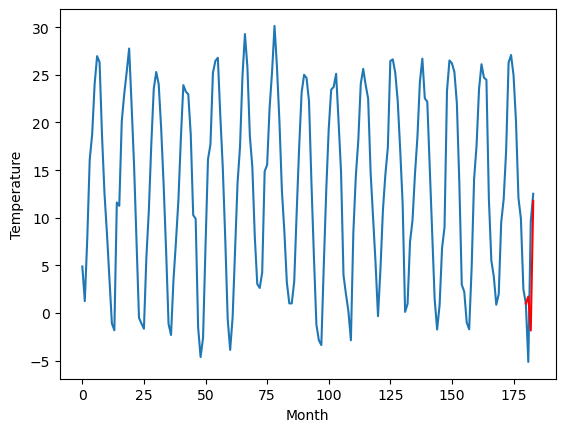

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		3.01		-2.58
9.02		-0.55		-9.57
10.62		13.05		2.43
[180, 181, 182, 183]
[14.25, 3.011221780776977, -0.5547686672210697, 13.050524606704712]


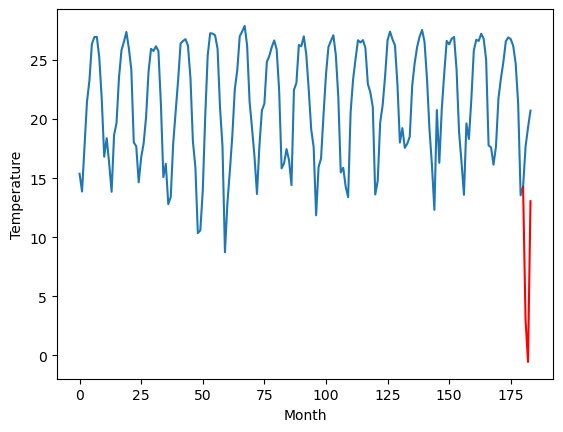

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		13.50		-1.91
13.49		9.94		-3.55
22.82		23.54		0.72
[180, 181, 182, 183]
[9.06, 13.501221780776978, 9.935231332778931, 23.540524606704714]


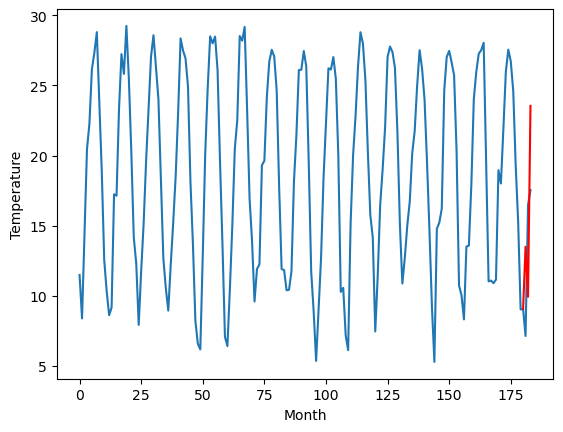

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		9.61		-0.96
7.11		6.05		-1.06
18.07		19.65		1.58
[180, 181, 182, 183]
[7.48, 9.611221780776978, 6.045231332778931, 19.650524606704714]


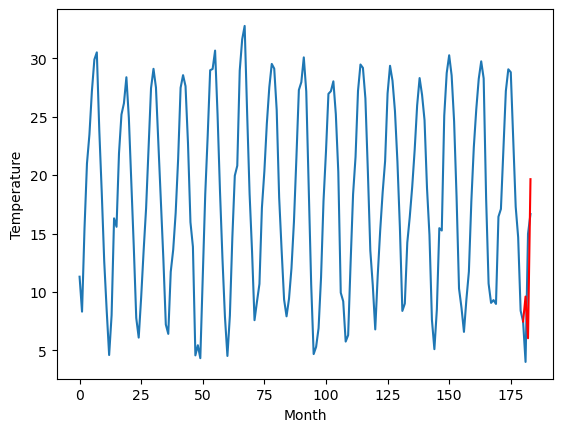

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		9.43		-1.28
6.82		5.87		-0.95
17.74		19.47		1.73
[180, 181, 182, 183]
[7.33, 9.431221780776978, 5.865231332778931, 19.470524606704714]


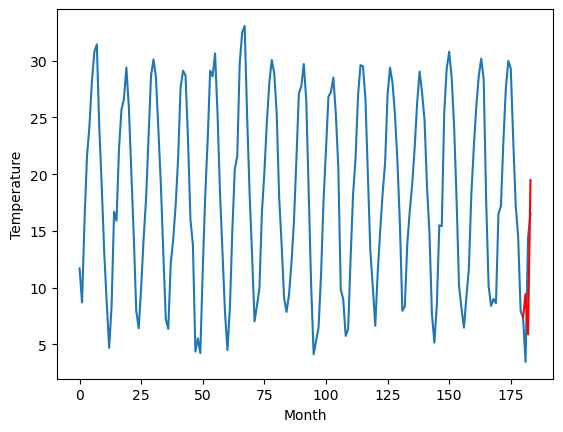

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		9.81		-0.78
9.02		6.25		-2.77
18.27		19.85		1.58
[180, 181, 182, 183]
[6.59, 9.811221780776977, 6.24523133277893, 19.85052460670471]


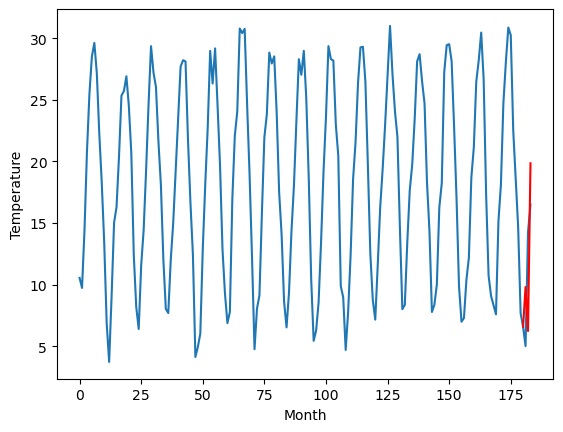

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		8.68		-2.11
11.46		5.12		-6.34
17.86		18.72		0.86
[180, 181, 182, 183]
[6.04, 8.681221780776978, 5.115231332778931, 18.720524606704714]


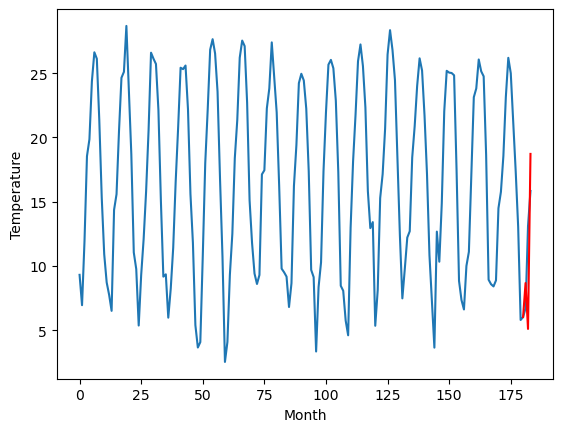

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		7.44		-0.21
4.04		3.88		-0.16
16.31		17.48		1.17
[180, 181, 182, 183]
[3.13, 7.441221780776978, 3.875231332778931, 17.480524606704712]


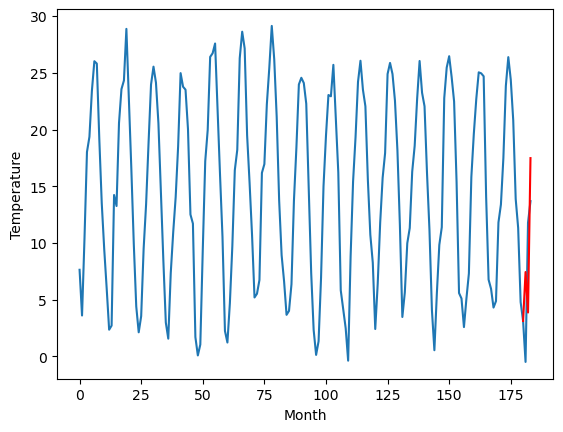

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		5.76		-0.30
2.70		2.20		-0.50
14.67		15.80		1.13
[180, 181, 182, 183]
[-0.29, 5.761221780776977, 2.1952313327789303, 15.800524606704712]


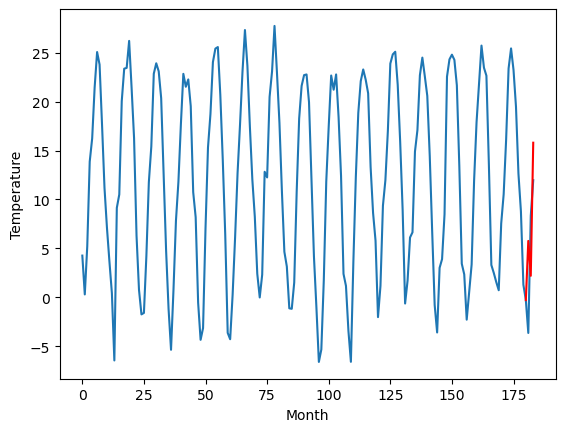

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		2.38		0.15
-2.21		-1.18		1.03
11.65		12.42		0.77
[180, 181, 182, 183]
[-1.03, 2.3812217807769773, -1.1847686672210695, 12.420524606704712]


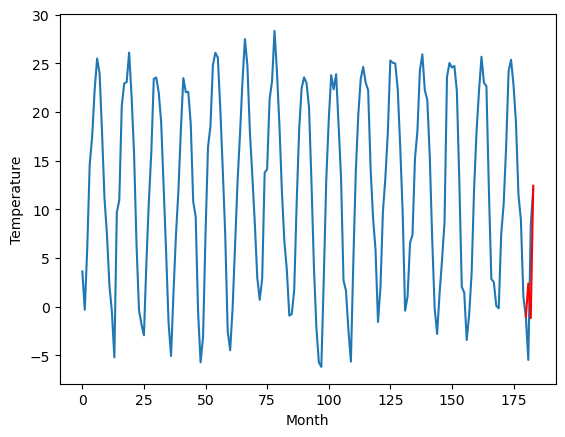

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		1.74		0.04
-0.54		-1.82		-1.28
9.35		11.78		2.43
[180, 181, 182, 183]
[-2.29, 1.7412217807769776, -1.8247686672210692, 11.780524606704713]


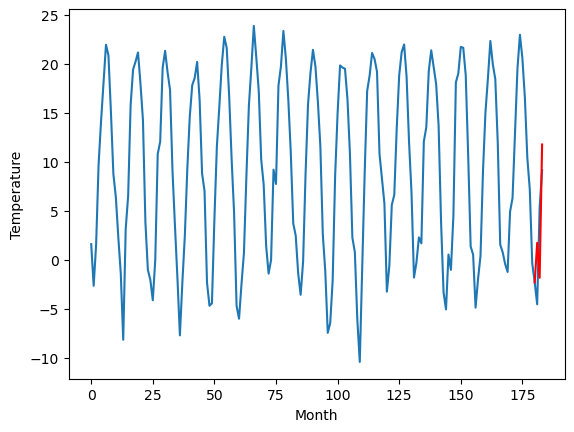

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   1.741222
1                 1    5.59   3.011222
2                 2   15.41  13.501222
3                 3   10.57   9.611222
4                 4   10.71   9.431222
5                 5   10.59   9.811222
6                 6   10.79   8.681222
7                 7    7.65   7.441222
8                 8    6.06   5.761222
9                 9    2.23   2.381222
10               10    1.70   1.741222


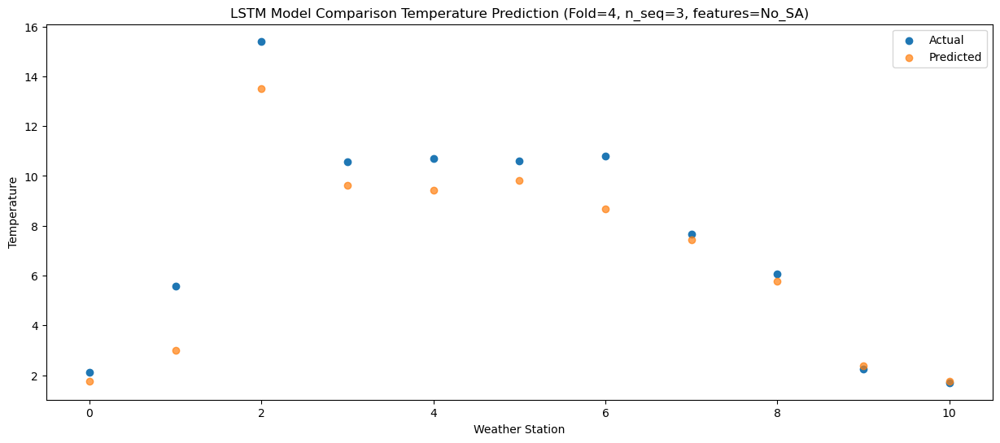

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -1.824769
1                 1    9.02  -0.554769
2                 2   13.49   9.935231
3                 3    7.11   6.045231
4                 4    6.82   5.865231
5                 5    9.02   6.245231
6                 6   11.46   5.115231
7                 7    4.04   3.875231
8                 8    2.70   2.195231
9                 9   -2.21  -1.184769
10               10   -0.54  -1.824769


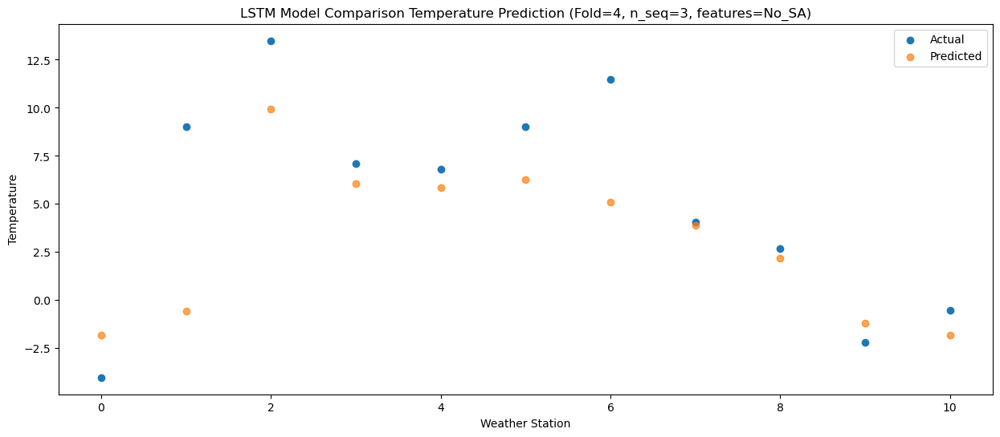

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71  11.780525
1                 1   10.62  13.050525
2                 2   22.82  23.540525
3                 3   18.07  19.650525
4                 4   17.74  19.470525
5                 5   18.27  19.850525
6                 6   17.86  18.720525
7                 7   16.31  17.480525
8                 8   14.67  15.800525
9                 9   11.65  12.420525
10               10    9.35  11.780525


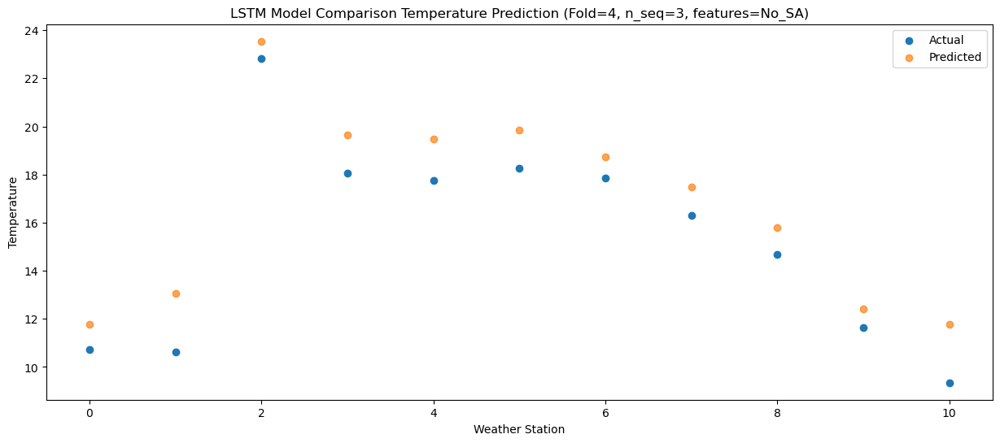

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]]
[[ 1.74122178  3.01122178 13.50122178  9.61122178  9.43122178  9.81122178
   8.68122178  7.44122178  5.76122178  2.38122178  1.74122178]
 [-1.82476867 -0.55476867  9.93523133  6.04523133  5.86523133  6.24523133
   5.11523133  3.87523133  2.19523133 -1.18476867 -1.82476867]
 [11.78052461 13.05052461 23.54052461 19.65052461 19.47052461 19.85052461
  18.72052461 17.48052461 15.80052461 12.42052461 11.78052461]]
Year at t+1:
t+1 SKRMSE: 1.286112
t+1 KRMSE: 1.286112
t+1 MAE: 0.971041
t+1 SKMAPE: 0.127973
t+1 R2_SCORE: 0.908478
t+1 KMAPE: 0.127973
t+1 PEARSON: 0.964881
t+1 AVERAGE ACTUAL: 7.582727
Year at t+2:
t+2 SKRMSE: 3.838987
t+2 KRMSE: 3.838987
t+2 MAE: 2.676671
t+2 SKMAPE: 0.553905
t+2 R2_SCORE: 0.499364
t+2 KMAPE: -0.062310
t+2 PEARSON: 0.660650
t+2 AVERAGE ACTUAL: 5.171818

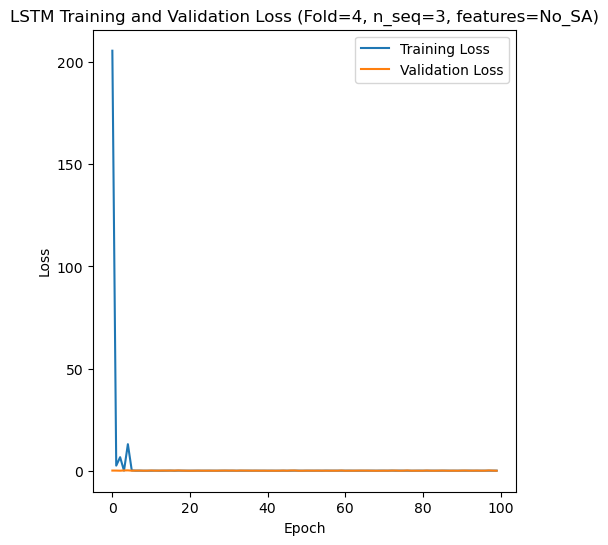

[[5.342497523712376], [2.262093608927942], [3.285414517141865], [4.4351968616392865], [2.4970545656523453]]
[[array(5.34249752)], [array(2.26209361)], [array(3.28541452)], [array(4.43519686)], [array(2.49705457)]]
[[4.970294309962879], [1.6907695618542757], [2.4744154886043437], [3.4507950947501436], [1.684866632692742]]
[[1.0724726003259526], [0.25304548260636817], [0.26170260895875874], [1.8768985736199657], [0.2622932890247763]]
[[0.06921100883749098], [0.7603748233334939], [0.5683922559317391], [0.354216124350087], [0.8434492556838885]]
[[array(0.3386905)], [array(0.25304548)], [array(0.26170261)], [array(1.68945385)], [array(0.05688818)]]
[[array(0.88748981)], [array(0.89461771)], [array(0.71397615)], [array(0.7775867)], [array(0.87557495)]]
[ 4.43  1.08 12.15 12.87 12.78 17.84 15.34 16.2  22.18  9.    7.43 15.34
 13.35 10.26 20.16 11.52 12.17 17.07 10.21 10.85 17.83  7.91  8.53 15.05
  7.08  2.81 15.28  4.9   2.73 13.48  3.68 -0.63 11.1   8.38  8.6  13.58
 12.   12.66 19.43  8.77

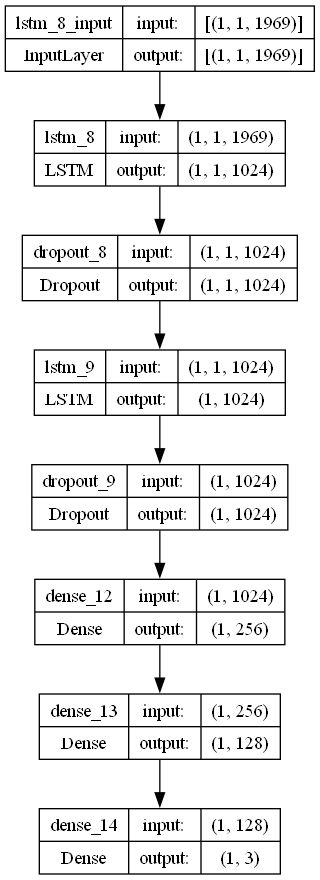

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr =  0.30861173110805173
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.44613235732750156

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S3_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)